In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Initial stage

In [ ]:
import pandas as pd


texas_diab=pd.read_csv(r"/content/drive/MyDrive/Diabetes Dataset texas.csv")

In [ ]:
texas_diab['Age'].mean()

42.85192307692308

In [ ]:
texas_diab['Age']=texas_diab['Age'].fillna(method='bfill')
texas_diab['Education Completed'].mean()

15.078149300155522

In [ ]:
texas_diab.head()

,Survey ID,Age,Gender,Ethnicity,Marital Status,Education Completed,Household Size,No One,Spouse,Children,...,Other Description (Non-city-based Ethnic),Paper (Non-city-based General),TV/Radio (Non-city-based General),Website (Non-city-based General),Social Networks (Non-city-based General),People (Non-city-based General),Other (Non-city-based General),Other Description (Non-city-based General),Preferred Type,Concerns
0,80314,60.0,NaN,Vietnamese,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,60171,60.0,Male,Chinese,Married,13.0,6.0,0,0,Living with children,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1011601,23.0,Female,Chinese,Single,16.0,3.0,0,0,0,...,NaN,No,No,No,No,Yes,No,NaN,email,traffic
3,50046,73.0,Female,Chinese,Other,13.0,1.0,Living with no one,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10494,29.0,Male,Asian Indian,Single,17.0,1.0,Living with no one,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#pd.set_option('max_rows', 9999)
a = (texas_diab.isnull().sum(axis=1)/231)*100
#for i in range(0,len(a)):
#  if a[i]>20:
#    texas_diab.drop([i],axis=0, inplace=True)
for i in range(0,len(a)):
  if a[i]>20:
    texas_diab.drop([i],axis=0, inplace=True)


In [ ]:
s=texas_diab.isnull().sum(axis=0)
m=s.to_dict()
new={}
for key,value in m.items():
  if value >1000:
    new[key] = value
columns_del=list(new.keys())
columns_del

['Other Description',
 'Religion Other',
 'Other Employment Description',
 'Occupation Other',
 'Health Info Discription',
 'Housing (Other)',
 'Status of Ownership (Other)',
 'Other Transportation Description',
 'Other Description (City-based)',
 'Other Description (Non-city-based Ethnic)',
 'Other Description (Non-city-based General)',
 'Concerns']

In [ ]:
texas_diab.isnull().sum()

Survey ID                                        0
Age                                              0
Gender                                          24
Ethnicity                                        0
Marital Status                                  13
                                              ... 
People (Non-city-based General)                 25
Other (Non-city-based General)                  27
Other Description (Non-city-based General)    2551
Preferred Type                                 541
Concerns                                      1271
Length: 231, dtype: int64

In [ ]:
diab[diab['Age'].isnull()==True]

,Survey ID,Age,Gender,Ethnicity,Marital Status,Education Completed,Household Size,No One,Spouse,Children,...,Other Description (Non-city-based Ethnic),Paper (Non-city-based General),TV/Radio (Non-city-based General),Website (Non-city-based General),Social Networks (Non-city-based General),People (Non-city-based General),Other (Non-city-based General),Other Description (Non-city-based General),Preferred Type,Concerns


In [ ]:
diab=texas_diab.dropna(subset=['Diabetes'])

In [ ]:
from math import ceil
age_gen=diab.loc[(diab['Arthritis']== 'Yes') & (diab['Spouse']=='Living with spouse')& (diab['Ethnicity']== 'Vietnamese')]
age_imp=age_gen['Age'].mean()
gen_imp=age_gen['Gender'].mode()

diab.loc[(diab['Survey ID']==80436) & (diab['Age'].isna()==True ), 'Age'] = age_imp
diab.loc[(diab['Survey ID']==80436) & (diab['Gender'].isna()==True ), 'Gender'] = "Male"

print(diab.loc[(diab['Survey ID']==80436)])

      Survey ID   Age Gender   Ethnicity Marital Status  Education Completed  \
1873      80436  37.0   Male  Vietnamese        Married                  8.0   

      Household Size No One              Spouse Children  ...  \
1873             2.0      0  Living with spouse        0  ...   

     Other Description (Non-city-based Ethnic) Paper (Non-city-based General)  \
1873                                       NaN                             No   

      TV/Radio (Non-city-based General) Website (Non-city-based General)  \
1873                                Yes                               No   

      Social Networks (Non-city-based General)  \
1873                                        No   

     People (Non-city-based General)  Other (Non-city-based General)  \
1873                              No                              No   

     Other Description (Non-city-based General) Preferred Type Concerns  
1873                                        NaN        Website      NaN 

In [ ]:
age=diab.loc[(diab['Ethnicity']== 'Vietnamese') & (diab['Spouse']=='Living with spouse') & (diab['Children']=='Living with children') & (diab['Gender']=='Female') & (diab['Religion']=='Buddhist')]
age_imp=round(age['Age'].mean())
diab.loc[(diab['Survey ID']==80242) & (diab['Age'].isna()==True ), 'Age'] = age_imp
print(diab.loc[(diab['Survey ID']==80242)])

      Survey ID   Age  Gender   Ethnicity Marital Status  Education Completed  \
1945      80242  25.0  Female  Vietnamese        Married                 12.0   

      Household Size No One              Spouse              Children  ...  \
1945             4.0      0  Living with spouse  Living with children  ...   

     Other Description (Non-city-based Ethnic) Paper (Non-city-based General)  \
1945                                       NaN                             No   

      TV/Radio (Non-city-based General) Website (Non-city-based General)  \
1945                                 No                               No   

      Social Networks (Non-city-based General)  \
1945                                        No   

     People (Non-city-based General)  Other (Non-city-based General)  \
1945                              No                              No   

     Other Description (Non-city-based General)     Preferred Type Concerns  
1945                                    

In [ ]:
age=diab.loc[(diab['Ethnicity']== 'Vietnamese') & (diab['No One']=='Living with no one') & (diab['Gender']=='Male') & (diab['Religion']=='Buddhist')]
age_imp=round(age['Age'].mean())
diab.loc[(diab['Survey ID']==8043901) & (diab['Age'].isna()==True ), 'Age'] = age_imp
print(diab.loc[(diab['Survey ID']==8043901)])

      Survey ID   Age Gender   Ethnicity Marital Status  Education Completed  \
2023    8043901  41.0   Male  Vietnamese         Single                 16.0   

      Household Size              No One Spouse Children  ...  \
2023             1.0  Living with no one      0        0  ...   

     Other Description (Non-city-based Ethnic) Paper (Non-city-based General)  \
2023                                       NaN                             No   

      TV/Radio (Non-city-based General) Website (Non-city-based General)  \
2023                                 No                               No   

      Social Networks (Non-city-based General)  \
2023                                        No   

     People (Non-city-based General)  Other (Non-city-based General)  \
2023                              No                              No   

     Other Description (Non-city-based General) Preferred Type Concerns  
2023                                        NaN            NaN      NaN 

In [ ]:
age=diab.loc[(diab['Ethnicity']== 'Filipino') & (diab['Marital Status']=='Single') & (diab['Gender']=='Female') & (diab['Religion']=='Catholic')]
age_imp=round(age['Age'].mean())

diab.loc[(diab['Survey ID']==100040129) & (diab['Age'].isna()==True ), 'Age'] = age_imp
print(diab.loc[(diab['Survey ID']==100040129)])

      Survey ID   Age  Gender Ethnicity Marital Status  Education Completed  \
2308  100040129  46.0  Female  Filipino         Single                 17.0   

      Household Size              No One Spouse Children  ...  \
2308             1.0  Living with no one      0        0  ...   

     Other Description (Non-city-based Ethnic) Paper (Non-city-based General)  \
2308                                       NaN                             No   

      TV/Radio (Non-city-based General) Website (Non-city-based General)  \
2308                                 No                               No   

      Social Networks (Non-city-based General)  \
2308                                       Yes   

     People (Non-city-based General)  Other (Non-city-based General)  \
2308                              No                              No   

     Other Description (Non-city-based General)    Preferred Type Concerns  
2308                                        NaN  newspaper/online      

In [ ]:
age=diab.loc[(diab['Ethnicity']== 'Filipino') & (diab['Marital Status']=='Married') & (diab['Gender']=='Male') & (diab['Religion']=='Catholic')]
age_imp=round(age['Age'].mean())

diab.loc[(diab['Survey ID']==11089) & (diab['Age'].isna()==True ), 'Age'] = age_imp
print(diab.loc[(diab['Survey ID']==11089)])

      Survey ID   Age Gender Ethnicity Marital Status  Education Completed  \
2322      11089  40.0   Male  Filipino        Married                 16.0   

      Household Size No One              Spouse              Children  ...  \
2322             3.0      0  Living with spouse  Living with children  ...   

     Other Description (Non-city-based Ethnic) Paper (Non-city-based General)  \
2322                                       NaN                             No   

      TV/Radio (Non-city-based General) Website (Non-city-based General)  \
2322                                Yes                              Yes   

      Social Networks (Non-city-based General)  \
2322                                       Yes   

     People (Non-city-based General)  Other (Non-city-based General)  \
2322                              No                              No   

     Other Description (Non-city-based General)      Preferred Type  \
2322                                        NaN  Webs

<ipython-input-56-61767a1964bc>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(diab['Age'])


<Axes: xlabel='Age', ylabel='Density'>

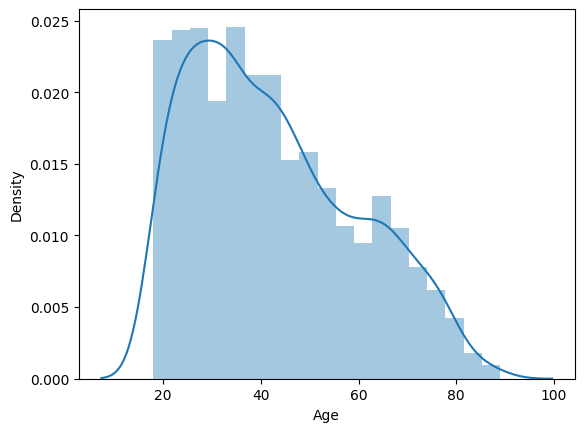

In [ ]:
import seaborn as sns
sns.distplot(diab['Age'])

In [ ]:
#pd.set_option('max_rows',99)
diab.isnull().sum()

Survey ID                                        0
Age                                              0
Gender                                          23
Ethnicity                                        0
Marital Status                                  13
                                              ... 
People (Non-city-based General)                 24
Other (Non-city-based General)                  26
Other Description (Non-city-based General)    2525
Preferred Type                                 535
Concerns                                      1258
Length: 231, dtype: int64

In [ ]:
diab['Gender'].value_counts()

Female    1384
Male      1131
Name: Gender, dtype: int64

In [ ]:
feature_name='Age'

male_counts = diab.loc[diab.Gender.values == 'Male', feature_name].value_counts()
female_counts = diab.loc[diab.Gender.values == 'Female', feature_name].value_counts()

print("Male age Group: ", male_counts)
print("Female age Group:", female_counts)

Male age Group:  32.0    47
25.0    41
30.0    40
40.0    35
35.0    34
        ..
84.0     2
89.0     2
86.0     1
87.0     1
85.0     1
Name: Age, Length: 72, dtype: int64
Female age Group: 25.0    41
19.0    38
41.0    38
21.0    36
44.0    35
        ..
79.0     3
89.0     2
83.0     1
84.0     1
88.0     1
Name: Age, Length: 69, dtype: int64


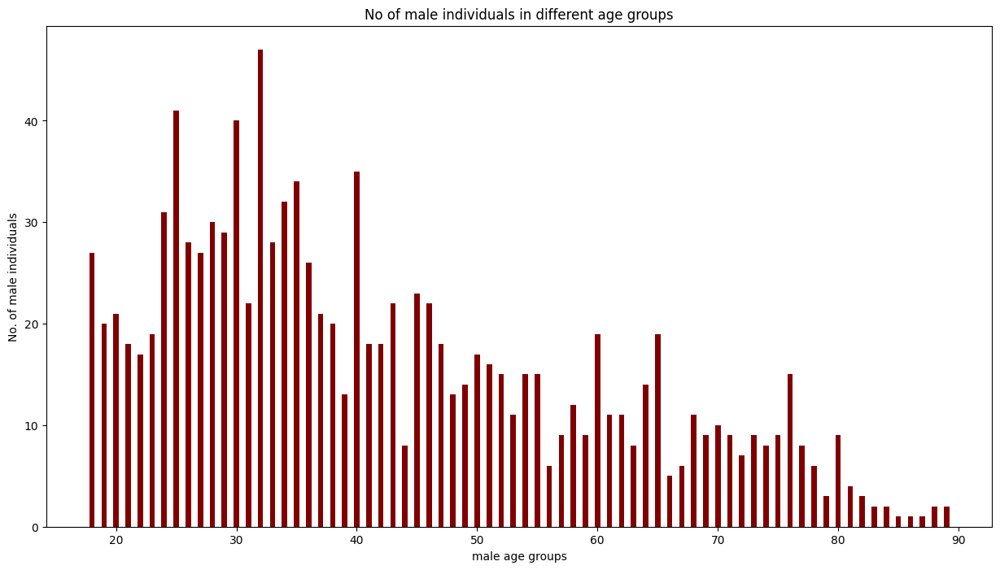

In [ ]:
import matplotlib.pyplot as plt
a=male_counts.to_dict()
nm = list(a.values())
m = list(a.keys())

fig = plt.figure(figsize = (15, 8))

# creating the bar plot
plt.bar(m,nm, color ='maroon',
        width = 0.45)

plt.xlabel("male age groups")
plt.ylabel("No. of male individuals")
plt.title("No of male individuals in different age groups")
plt.show()

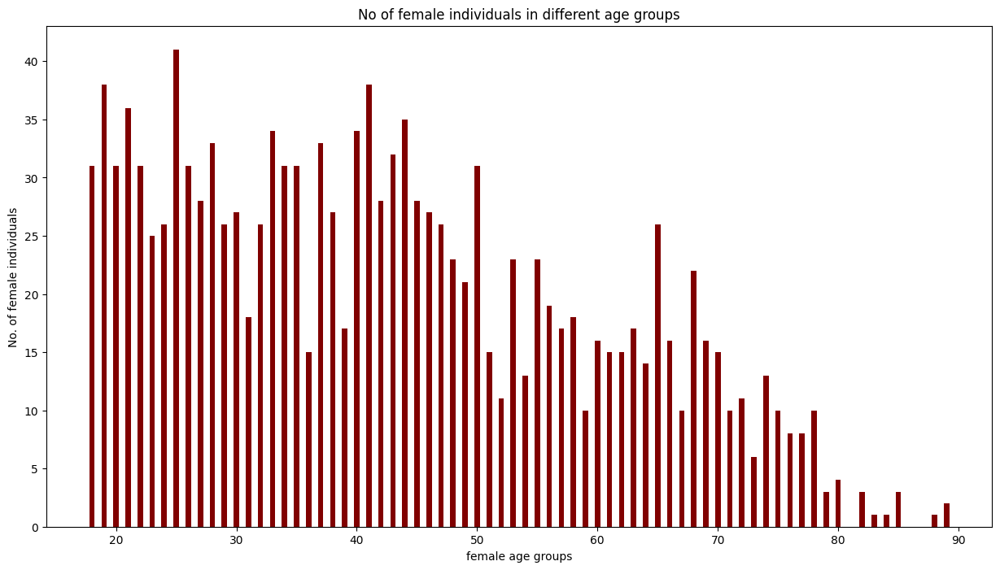

In [ ]:
import matplotlib.pyplot as plt
a=female_counts.to_dict()
nm = list(a.values())
m = list(a.keys())

fig = plt.figure(figsize = (15, 8))

# creating the bar plot
plt.bar(m,nm, color ='maroon',
        width = 0.45)

plt.xlabel("female age groups")
plt.ylabel("No. of female individuals")
plt.title("No of female individuals in different age groups")
plt.show()

In [ ]:
diab['Marital Status'].value_counts()

Married                  1681
Single                    711
Living with a partner     107
Other                      26
Name: Marital Status, dtype: int64

In [ ]:
 def cross_tab(data,f1,f2):
    # find no of unique values in jobs colums
    a=list(data[f1].unique())
    # find no of unique values in education columns
    b=list(data[f2].unique())
    dataframes=[]
    for e in b:
        dfe=data[data[f2]==e]
        # https://www.youtube.com/watch?v=qy0fDqoMJx8 for groupby operation
        #https://www.youtube.com/watch?v=hfDXRyYIFkk grupby count
        #https://data36.com/pandas-tutorial-2-aggregation-and-grouping/
        dfea=dfe.groupby(f1).count()[f2]
        dataframes.append(dfea)
        #https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.concat.html
    xx=pd.concat(dataframes,axis=1)
    xx.columns=b
    xx=xx.fillna(0)
    return xx

In [ ]:
diab.loc[(diab['Age']>45) & (diab['Marital Status'].isna()==True ), 'Marital Status'] = 'Married'
diab.loc[(diab['Age']<25) & (diab['Marital Status'].isna()==True ), 'Marital Status'] = 'Single'

In [ ]:
diab.loc[(diab['Marital Status'].isna()==True ), 'Marital Status'] = 'Married'

In [ ]:
#pd.set_option('max_rows', 999)
diab.isnull().sum()

Survey ID                                        0
Age                                              0
Gender                                          23
Ethnicity                                        0
Marital Status                                   0
                                              ... 
People (Non-city-based General)                 24
Other (Non-city-based General)                  26
Other Description (Non-city-based General)    2525
Preferred Type                                 535
Concerns                                      1258
Length: 231, dtype: int64

In [ ]:
diab['Marital Status'].value_counts()

Married                  1693
Single                    712
Living with a partner     107
Other                      26
Name: Marital Status, dtype: int64

In [ ]:
diab.groupby(['Gender','Ethnicity','Marital Status'],dropna=False).Ethnicity.count()

Gender  Ethnicity     Marital Status       
Female  Asian Indian  Living with a partner     15
                      Married                  172
                      Other                      1
                      Single                    38
        Chinese       Living with a partner      6
                      Married                  237
                      Other                      3
                      Single                   106
        Filipino      Living with a partner      4
                      Married                  106
                      Other                      2
                      Single                    66
        Korean        Living with a partner      6
                      Married                  200
                      Other                      9
                      Single                    59
        Other         Living with a partner      1
                      Married                   48
                      Other           

# Imputing Gender based on population

In [ ]:
diab.loc[(diab['Gender'].isna()==True ) & (diab['Ethnicity']=='Asian Indian')& (diab['Marital Status']=='Married'), 'Gender'] = 'Male'

In [ ]:
diab.loc[(diab['Gender'].isna()==True ) & (diab['Ethnicity']=='Chinese')& (diab['Marital Status']=='Living with a partner'), 'Gender'] = 'Male'
diab.loc[(diab['Gender'].isna()==True ) & (diab['Ethnicity']=='Chinese')& (diab['Marital Status']=='Married'), 'Gender'] = 'Female'
diab.loc[(diab['Gender'].isna()==True ) & (diab['Ethnicity']=='Chinese')& (diab['Marital Status']=='Single'), 'Gender'] = 'Female'

In [ ]:
diab.loc[(diab['Gender'].isna()==True ) & (diab['Ethnicity']=='Filipino')& (diab['Marital Status']=='Married'), 'Gender'] = 'Female'
diab.loc[(diab['Gender'].isna()==True ) & (diab['Ethnicity']=='Filipino')& (diab['Marital Status']=='Single'), 'Gender'] = 'Female'

In [ ]:
diab.loc[(diab['Gender'].isna()==True ) & (diab['Ethnicity']=='Vietnamese')& (diab['Marital Status']=='Married'), 'Gender'] = 'Female'
diab.loc[(diab['Gender'].isna()==True ) & (diab['Ethnicity']=='Vietnamese')& (diab['Marital Status']=='Single'), 'Gender'] = 'Female'

In [ ]:
diab.isnull().sum()

Survey ID                                        0
Age                                              0
Gender                                           0
Ethnicity                                        0
Marital Status                                   0
                                              ... 
People (Non-city-based General)                 24
Other (Non-city-based General)                  26
Other Description (Non-city-based General)    2525
Preferred Type                                 535
Concerns                                      1258
Length: 231, dtype: int64

In [ ]:
diab['Education Completed'].skew()

-1.7691185421450792

0    17.0
Name: Education Completed, dtype: float64


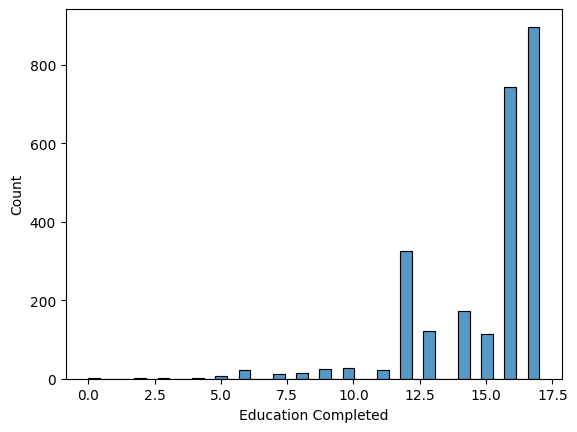

In [ ]:
sns.histplot(diab['Education Completed'])
print(diab['Education Completed'].mode())
diab.loc[(diab['Education Completed'].isna()==True ), 'Education Completed'] = 17.0
#diab['Education Completed'] = diab['Education Completed'].fillna(diab['Education Completed'].mode())

In [ ]:
diab['Education Completed'].skew()

-1.782483750483499

In [ ]:
import numpy as np
diab['Education Completed'] = diab['Education Completed'].apply(lambda x: np.power(x,3))


<ipython-input-77-88f4e90f748d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diab['Education Completed'] = diab['Education Completed'].apply(lambda x: np.power(x,3))


In [ ]:
diab.isnull().sum()

Survey ID                                        0
Age                                              0
Gender                                           0
Ethnicity                                        0
Marital Status                                   0
                                              ... 
People (Non-city-based General)                 24
Other (Non-city-based General)                  26
Other Description (Non-city-based General)    2525
Preferred Type                                 535
Concerns                                      1258
Length: 231, dtype: int64

3.0


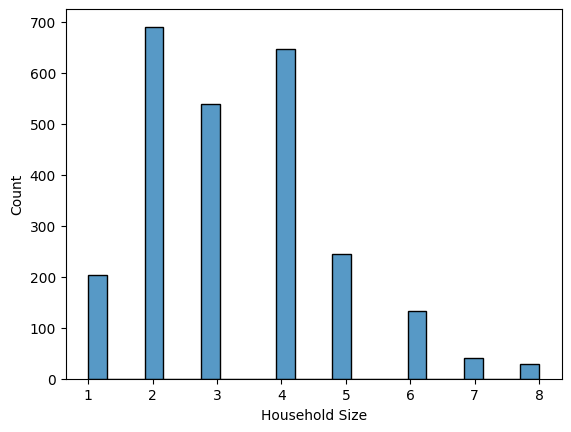

In [ ]:
sns.histplot(diab['Household Size'])
print(diab['Household Size'].median())
diab.loc[(diab['Household Size'].isna()==True ), 'Household Size'] = 3.0

In [ ]:
diab.isnull().sum()

Survey ID                                        0
Age                                              0
Gender                                           0
Ethnicity                                        0
Marital Status                                   0
                                              ... 
People (Non-city-based General)                 24
Other (Non-city-based General)                  26
Other Description (Non-city-based General)    2525
Preferred Type                                 535
Concerns                                      1258
Length: 231, dtype: int64

In [ ]:
diab['Brother/Sister'].value_counts()

0                               2362
Living with brothers/sisters     175
Name: Brother/Sister, dtype: int64

# Square root transform

In [ ]:
from scipy import stats
import numpy as np

diab['Household Size'] = diab['Household Size'].apply(lambda x: np.sqrt(x))
diab['Household Size'].skew()

<ipython-input-82-52f8195b844c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diab['Household Size'] = diab['Household Size'].apply(lambda x: np.sqrt(x))


0.07861081630087297

In [ ]:
diab.loc[(diab['Grandparent'].isna()==True ), 'Grandparent'] = 'Living with Grandparent'

In [ ]:
diab.loc[(diab['Other Relative'].isna()==True ), 'Other Relative'] = 'Living with Other Relative'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
diab.drop(['Other Description',
 'Religion Other',
 'Other Employment Description',
 'Occupation Other',
 'Health Info Discription',
 'Housing (Other)',
 'Status of Ownership (Other)',
 'Other Transportation Description',
 'Other Description (City-based)',
 'Other Description (Non-city-based Ethnic)',
 'Other Description (Non-city-based General)',
 'Concerns'],axis=1, inplace=True)

<ipython-input-86-0940b549f47f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diab.drop(['Other Description',


In [ ]:
diab.isnull().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
                                           ... 
Website (Non-city-based General)             24
Social Networks (Non-city-based General)     24
People (Non-city-based General)              24
Other (Non-city-based General)               26
Preferred Type                              535
Length: 219, dtype: int64

In [ ]:
diab.rename(columns = {'Other':'Source of Health Information', 'Other ':'Living with?'}, inplace = True)

<ipython-input-88-d745b1d4577d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diab.rename(columns = {'Other':'Source of Health Information', 'Other ':'Living with?'}, inplace = True)


In [ ]:
diab.drop(['Living with?'],axis=1, inplace=True)

<ipython-input-89-89fe4a7ebc3f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diab.drop(['Living with?'],axis=1, inplace=True)


In [ ]:
diab['Religion'].value_counts()

Protestant    626
None          501
Catholic      476
Hindu         466
Buddhist      341
Muslim         66
Other          44
Name: Religion, dtype: int64

In [ ]:
diab.loc[(diab['Religion'].isna()==True ), 'Religion'] = 'Other'

In [ ]:
diab['Religion'].value_counts()

Protestant    626
None          501
Catholic      476
Hindu         466
Buddhist      341
Muslim         66
Other          62
Name: Religion, dtype: int64

In [ ]:
diab.isnull().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
                                           ... 
Website (Non-city-based General)             24
Social Networks (Non-city-based General)     24
People (Non-city-based General)              24
Other (Non-city-based General)               26
Preferred Type                              535
Length: 218, dtype: int64

In [ ]:
diab[diab['Full Time Employment'].isnull()].iloc[:,:20]

,Survey ID,Age,Gender,Ethnicity,Marital Status,Education Completed,Household Size,No One,Spouse,Children,Grand Children,Parent,Grandparent,Brother/Sister,Other Relative,Friends,Religion,Full Time Employment,Part Time Employment,Self Employed Full Time
1275,70338,43.0,Male,Korean,Married,4096.0,2.000000,0,Living with spouse,Living with children,0,0,0.0,0,0.0,0,Protestant,NaN,NaN,NaN
1584,70466,81.0,Male,Korean,Living with a partner,216.0,1.732051,0,0,Living with children,Living with grandchildren,0,0.0,Living with brothers/sisters,0.0,0,Protestant,NaN,NaN,NaN
1622,70511,68.0,Female,Korean,Single,4096.0,1.414214,0,0,Living with children,0,0,0.0,0,0.0,0,Protestant,NaN,NaN,NaN


In [ ]:
diab.iloc[1200:1700,:20]

,Survey ID,Age,Gender,Ethnicity,Marital Status,Education Completed,Household Size,No One,Spouse,Children,Grand Children,Parent,Grandparent,Brother/Sister,Other Relative,Friends,Religion,Full Time Employment,Part Time Employment,Self Employed Full Time
1236,70063,36.0,Female,Korean,Married,4096.0,2.000000,0,Living with spouse,Living with children,0,0,0.0,0,0.0,0,Protestant,0,0,0.0
1237,70222,57.0,Female,Korean,Married,1728.0,2.000000,0,Living with spouse,Living with children,0,0,0.0,0,0.0,0,Protestant,0,Employed part time,0.0
1238,70309,47.0,Male,Korean,Married,4913.0,2.000000,0,Living with spouse,Living with children,0,0,0.0,0,0.0,0,None,0,0,0.0
1239,70293,58.0,Female,Korean,Married,1728.0,1.414214,0,Living with spouse,0,0,0,0.0,0,0.0,0,None,0,Employed part time,0.0
1241,10313,74.0,Male,Korean,Married,2744.0,2.000000,0,Living with spouse,Living with children,0,0,0.0,0,Living with Other Relative,0,Protestant,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1746,80171,23.0,Male,Vietnamese,Single,3375.0,2.000000,Living with no one,0,0,0,0,0.0,0,0.0,0,None,0,0,0.0
1747,80487,70.0,Female,Vietnamese,Living with a partner,729.0,2.828427,0,0,Living with children,0,0,0.0,0,0.0,0,Buddhist,0,0,0.0
1748,8022501,55.0,Male,Vietnamese,Married,1728.0,1.414214,0,Living with spouse,0,0,0,0.0,0,0.0,0,None,0,0,0.0
1749,80421,30.0,Female,Vietnamese,Married,2197.0,2.000000,0,Living with spouse,Living with children,0,0,0.0,0,0.0,0,Buddhist,0,0,0.0


In [ ]:
import pandas as pd

diab.to_csv('diab.csv')

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')
import pandas as pd

db=pd.read_csv(r"/content/drive/MyDrive/diab.csv")
db[db['Self Employed Full Time'].isnull()].iloc[:,:21]

In [ ]:
pd.set_option('max_rows', 999)
diab[diab['Self Employed Full Time'].isnull()].iloc[:,:21]

In [ ]:
diab[diab['Full Time Employment'].isnull()].iloc[:,:20]

In [ ]:
diab.groupby(['Gender','Ethnicity','Marital Status'],dropna=False).Ethnicity.count()

In [ ]:
diab.loc[(diab['Self Employed Full Time'].isna()==True ), 'Self Employed Full Time'] = 'Self Employed Full Time'
diab.loc[(diab['Self Employed Part Time'].isna()==True ), 'Self Employed Part Time'] = 'Self Employed Part Time'

In [ ]:
diab.isnull().sum()

In [ ]:
diab[diab['Retired'].isnull()== True]

In [ ]:
diab.loc[(diab['Retired'].isna()==True ) & (diab['Survey ID']==70466), 'Retired'] = 'Retired'
diab.loc[(diab['Retired'].isna()==True ) & (diab['Survey ID']==70511), 'Retired'] = 'Retired'
diab.loc[(diab['Retired'].isna()==True ) & (diab['Survey ID']==70338), 'Retired'] = 0



#Imputing unemployed

In [ ]:


diab[diab['Unemployed'].isnull()== True]
#diab.loc[(diab['Unemployed'].isna()==True ) & (diab['Age']<20), 'Unemployed'] = 'Unemployed'
#index = 194 1599 1745 1786 1896 2008 2226
#Survey ID =  40140, 10286,
diab.loc[(diab['Unemployed']!=0)]

,Survey ID,Age,Gender,Ethnicity,Marital Status,Education Completed,Household Size,No One,Spouse,Children,...,Social Networks (Non-city-based Ethnic),People (Non-city-based Ethnic),Other (Non-city-based Ethnic),Paper (Non-city-based General),TV/Radio (Non-city-based General),Website (Non-city-based General),Social Networks (Non-city-based General),People (Non-city-based General),Other (Non-city-based General),Preferred Type
2,1011601,23.0,Female,Chinese,Single,3.245186e+32,1.732051,0,0,0,...,No,Yes,No,No,No,No,No,Yes,No,email
63,50148,25.0,Female,Chinese,Single,3.245186e+32,1.414214,0,0,0,...,Yes,No,No,No,No,No,No,No,No,Internet
148,50224,61.0,Female,Chinese,Single,1.192533e+30,1.000000,Living with no one,0,0,...,No,No,No,No,Yes,No,No,No,No,telephone
165,60064,32.0,Female,Chinese,Married,1.667711e+33,1.414214,0,Living with spouse,0,...,No,No,No,No,No,No,No,No,No,network
167,60139,39.0,Female,Chinese,Married,1.373706e+29,1.414214,0,Living with spouse,0,...,No,No,No,Yes,Yes,Yes,No,No,No,NaN
194,40140,18.0,Male,Chinese,Single,1.000000e+27,2.000000,0,0,0,...,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,No,website
204,60101,72.0,Female,Chinese,Married,1.023490e+21,2.236068,0,Living with spouse,Living with children,...,No,No,No,No,No,No,No,No,No,TV
222,50230,25.0,Female,Chinese,Single,1.667711e+33,1.000000,Living with no one,0,0,...,No,No,No,No,No,Yes,No,No,No,internet
241,60074,24.0,Female,Chinese,Living with a partner,1.667711e+33,1.414214,0,0,0,...,No,No,No,No,No,No,No,No,No,internet
267,10063,25.0,Male,Chinese,Single,1.667711e+33,1.414214,0,0,0,...,No,No,No,Yes,No,Yes,No,No,No,Email


In [ ]:
diab.isnull().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
diab.loc[(diab['Student'].isna()== True)]
diab['Student'].value_counts()
diab.loc[(diab['Student'].isna()== True) , 'Student']=0
#diab.loc[(diab['Disabled'].isna()== True) & (diab['Marital Status']=='Single') & (diab['Gender']=='Female') & (diab['Religion']=='Catholic')]

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
diab.loc[(diab['Disabled'].isna()== True) & (diab['Age']>55), 'Disabled']='Disabled'
diab.loc[(diab['Disabled'].isna()== True), 'Disabled']= 0

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
diab.isnull().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
diab.loc[(diab['Homemaker'].isna()== True), 'Homemaker']='Full time homemaker'

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
#diab.loc[(diab[''].isna()== True) & (diab['Marital Status']=='Single') & (diab['Gender']=='Female') & (diab['Religion']=='Catholic')]

#Imputing Income

In [ ]:
diab.loc[(diab['Income'].isna()== True) & (diab['Retired']=='Retired'), 'Income']= '$0 - $9,999'
diab.loc[(diab['Income'].isna()== True) & (diab['Age']> 60), 'Income']= '$0 - $9,999'
#diab.loc[(diab['Income'].isna()== True) & (diab['']=='Retired'), 'Income']= '$0 - $9,999'

#diab.loc[(diab['Income'].isna()== True) & (diab['']> 60), 'Income']
ten_k=diab.loc[(diab['Income']=='$10,000 - $19,999')]
ten_k['Occupation'].mode() #Other

twen_k=diab.loc[(diab['Income']=='$20,000 - $29,999')]
twen_k['Occupation'].mode() #Service worker

thi_k=diab.loc[(diab['Income']=='$30,000 - $39,999')]
thi_k['Occupation'].mode() # other

fr_k=diab.loc[(diab['Income']=='$40,000 - $49,999')]
fr_k['Occupation'].mode()  #professional

fif_k=diab.loc[(diab['Income']=='$50,000 - $59,999')]
fif_k['Occupation'].mode() #professional

sixty_k=diab.loc[(diab['Income']=='$60,000 - $69,999')]
sixty_k['Occupation'].mode() #professional

seventy_k=diab.loc[(diab['Age']<60)]
seventy_k['Income'].mode() #professional

diab.loc[(diab['Income'].isna()== True) & (diab['Occupation']=='Other'), 'Income']= '$30,000 - $39,999'
diab.loc[(diab['Income'].isna()== True) , 'Income']= '$70,000 and over'

diab.isnull().sum()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Survey_ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital_Status                                0
Education_Completed                           0
Household_Size                                0
No_One                                        1
Spouse                                        1
Children                                      1
Grand_Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other_Relative                                0
Friends                                       1
Religion                                      0
Full_Time_Employment                          3
Part_Time_Employment                          3
Self_Employed_Full_Time                       0
Self_Employed_Part_Time                 

#Imputing Achieving Ends Meet

In [ ]:
diab.loc[(diab['Achieving Ends Meet'].isna()== True) & (diab['Income']=='$0 - $9,999') , 'Achieving Ends Meet']= 0
diab.loc[(diab['Achieving Ends Meet'].isna()== True) & (diab['Income']=='$70,000 and over') , 'Achieving Ends Meet']= 1

diab.loc[(diab['Achieving Ends Meet'].isna()== True) , 'Achieving Ends Meet']= 0

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
diab.loc[(diab['US Born'].isna()== True) , 'US Born']= 'Yes'

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
diab.isnull().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
time= diab['Duration of Residency'].mean()

diab.loc[(diab['Duration of Residency'].isna()== True), 'Duration of Residency']= time
diab.isnull().sum()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
diab.loc[(diab['Primary Language'].isna()== True), 'Primary Language']= 1
diab.isna().sum()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
speak=diab['English Speaking'].mode()
diff = diab['English Difficulties'].mode()
fam_am= diab['Familiarity with America'].mode()
fam_eo= diab['Familiarity with Ethnic Origin'].mode()

diab.loc[(diab['English Speaking'].isna()== True), 'English Speaking']= 'Very well'
diab.loc[(diab['English Difficulties'].isna()== True), 'English Difficulties']= 'Not at all'
diab.loc[(diab['Familiarity with America'].isna()== True), 'Familiarity with America']= 'High'
diab.loc[(diab['Familiarity with Ethnic Origin'].isna()== True), 'Familiarity with Ethnic Origin']= 'High'

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
diab.isna().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
diab.drop(['Identify Ethnically','Belonging','Discrimination '],axis=1,inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
diab.isnull().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
diab['Present Mental Health'].value_counts()
diab['Present Oral Health'].value_counts()
diab['Hygiene Assistance'].value_counts()
diab['Smoking'].value_counts()

diab['Drinking'].value_counts()

0.0    2445
1.0      81
Name: Drinking, dtype: int64

In [ ]:
diab.loc[(diab['Present Mental Health'].isna()== True), 'Present Mental Health']='Very Good'
diab.loc[(diab['Present Oral Health'].isna()== True), 'Present Oral Health']='Very Good'
diab.loc[(diab['Hygiene Assistance'].isna()== True), 'Hygiene Assistance']=0
diab.loc[(diab['Smoking'].isna()== True), 'Smoking']=0
diab.loc[(diab['Drinking'].isna()== True), 'Drinking']=0

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
diab.isnull().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
diab.drop(['Satisfaction'],axis=1,inplace=True)


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
diab.isnull().sum()


Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

In [ ]:
print(diab['Gender'].value_counts())

Female    1403
Male      1135
Name: Gender, dtype: int64


# Exploratory Data Analysis

In [ ]:
male=diab.loc[(diab['Gender']=='Male') & (diab['Diabetes']=='Yes')]
female=diab.loc[(diab['Gender']=='Female') & (diab['Diabetes']=='Yes')]

print('Average age of male diabetic patients:',male['Age'].mean())
print('Average age of female diabetic patients:',female['Age'].mean())


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


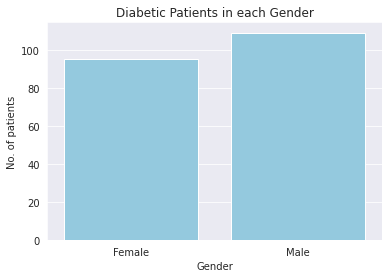

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
sns.set_style('darkgrid')

x = ['Female', 'Male']
y = [95,109]

plt.xlabel('Gender')
plt.ylabel('No. of patients')
plt.title('Diabetic Patients in each Gender')

sns.barplot(x, y, color='Skyblue')
plt.show()

In [ ]:
print('Majority of female diabetic patients are from:',female['Ethnicity'].mode())
print('Majority of male diabetic patients are from:',male['Ethnicity'].mode())

Majority of female diabetic patients are from: 0    Chinese
dtype: object
Majority of male diabetic patients are from: 0    Asian Indian
dtype: object


In [ ]:
ethnic= diab.loc[(diab['Diabetes']=='Yes')]
ethnic['Ethnicity'].value_counts()



Asian Indian    54
Vietnamese      49
Chinese         43
Korean          30
Filipino        24
Other            4
Name: Ethnicity, dtype: int64

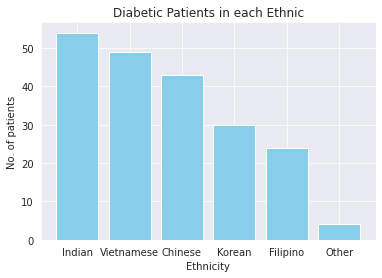

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
sns.set_style('darkgrid')
left = [1, 2,3,4,5,6]
height = [54,49,43,30,24,4]
tick_label = ['Indian','Vietnamese','Chinese','Korean','Filipino','Other']

plt.bar(left, height, tick_label = tick_label, width = 0.8, color = ['Skyblue'])
plt.xlabel('Ethnicity')
plt.ylabel('No. of patients')
plt.title('Diabetic Patients in each Ethnic')
plt.show()

In [ ]:
diab.groupby(['Ethnicity','Gender','Diabetes'],dropna=False).Gender.count()

Ethnicity     Gender  Diabetes
Asian Indian  Female  0           209
                      Yes          17
              Male    0           295
                      Yes          37
              NaN     0             0
Chinese       Female  0           328
                      Yes          24
              Male    0           249
                      Yes          19
              NaN     0             0
Filipino      Female  0           162
                      Yes          16
              Male    0            68
                      Yes           8
              NaN     0             0
Korean        Female  0           259
                      Yes          15
              Male    0           170
                      Yes          15
Other         Female  0            78
                      Yes           1
              Male    0            60
                      Yes           3
Vietnamese    Female  0           254
                      Yes          21
              Male 

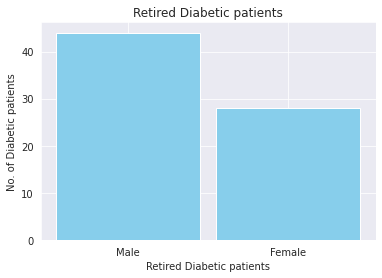

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
sns.set_style('darkgrid')

left = [1,2]
height = [44,28]
tick_label = ['Male','Female']
plt.bar(left, height, tick_label = tick_label, width = 0.9, color = ['Skyblue'])
plt.xlabel('Retired Diabetic patients')
plt.ylabel('No. of Diabetic patients')
plt.title('Retired Diabetic patients')
plt.show()


MALE AGE GROUP

No of male diabetic patients in the age group 15-25: 1
No of male diabetic patients in the age group 25-35: 10
No of male diabetic patients in the age group 35-45: 12
No of male diabetic patients in the age group 35-45: 22
No of male diabetic patients in the age group 45-55: 27
No of male diabetic patients in the age group 55-65: 21
No of male diabetic patients in the age group 65-75: 15
No of male diabetic patients in the age group 75-85: 1

FEMALE AGE GROUP

No of female diabetic patients in the age group 15-25: 1
No of female diabetic patients in the age group 25-35: 9
No of female diabetic patients in the age group 35-45: 9
No of female diabetic patients in the age group 35-45: 15
No of female diabetic patients in the age group 45-55: 26
No of female diabetic patients in the age group 55-65: 25
No of female diabetic patients in the age group 65-75: 9
No of female diabetic patients in the age group 75-85: 0


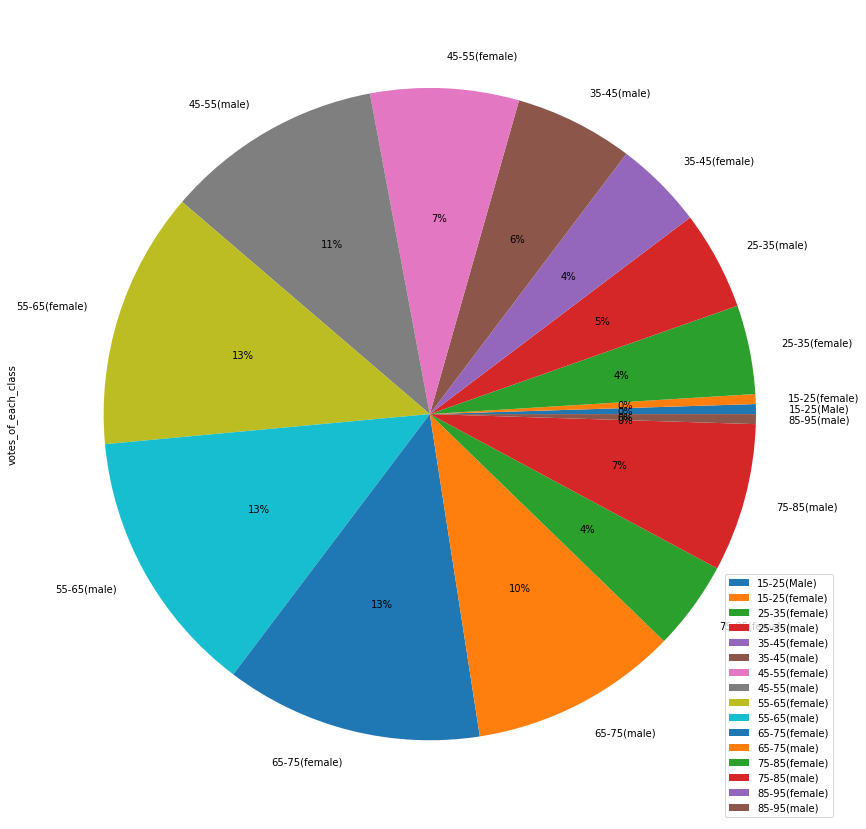

In [ ]:
print('\nMALE AGE GROUP\n')
print('No of male diabetic patients in the age group 15-25:',len(male.loc[(male['Age']>15)&(male['Age']<=25)]))
print('No of male diabetic patients in the age group 25-35:',len(male.loc[(male['Age']>25)&(male['Age']<=35)]))
print('No of male diabetic patients in the age group 35-45:',len(male.loc[(male['Age']>35)&(male['Age']<=45)]))
print('No of male diabetic patients in the age group 35-45:',len(male.loc[(male['Age']>45)&(male['Age']<=55)]))
print('No of male diabetic patients in the age group 45-55:',len(male.loc[(male['Age']>55)&(male['Age']<=65)]))
print('No of male diabetic patients in the age group 55-65:',len(male.loc[(male['Age']>65)&(male['Age']<=75)]))
print('No of male diabetic patients in the age group 65-75:',len(male.loc[(male['Age']>75)&(male['Age']<=85)]))
print('No of male diabetic patients in the age group 75-85:',len(male.loc[(male['Age']>85)&(male['Age']<=95)]))

print('\nFEMALE AGE GROUP\n')
print('No of female diabetic patients in the age group 15-25:',len(female.loc[(female['Age']>15)&(female['Age']<=25)]))
print('No of female diabetic patients in the age group 25-35:',len(female.loc[(female['Age']>25)&(female['Age']<=35)]))
print('No of female diabetic patients in the age group 35-45:',len(female.loc[(female['Age']>35)&(female['Age']<=45)]))
print('No of female diabetic patients in the age group 35-45:',len(female.loc[(female['Age']>45)&(female['Age']<=55)]))
print('No of female diabetic patients in the age group 45-55:',len(female.loc[(female['Age']>55)&(female['Age']<=65)]))
print('No of female diabetic patients in the age group 55-65:',len(female.loc[(female['Age']>65)&(female['Age']<=75)]))
print('No of female diabetic patients in the age group 65-75:',len(female.loc[(female['Age']>75)&(female['Age']<=85)]))
print('No of female diabetic patients in the age group 75-85:',len(female.loc[(female['Age']>85)&(female['Age']<=95)]))

dataframe = pd.DataFrame({'Name': ['15-25(Male)', '25-35(male)', '35-45(male)',
                                   '45-55(male)', '55-65(male)', '65-75(male)',
                                   '75-85(male)', '85-95(male)', '15-25(female)', '25-35(female)', '35-45(female)',
                                   '45-55(female)', '55-65(female)', '65-75(female)',
                                   '75-85(female)', '85-95(female)'],
                          'votes_of_each_class': [1,10,12,22,27,21,15,1,1,9,9,15,26,26,9,0]})

# Plotting the pie chart for above dataframe
dataframe.groupby(['Name']).sum().plot(
    kind='pie', y='votes_of_each_class', autopct='%1.0f%%',figsize=(15, 15))

In [ ]:
print('Marital Status of female diabetic population:',female['Marital Status'].value_counts())
print('Marital Status of male diabetic population:',male['Marital Status'].value_counts())

Marital Status of female diabetic population: Married                  69
Single                   15
Living with a partner     9
Other                     1
Name: Marital Status, dtype: int64
Marital Status of male diabetic population: Married                  90
Single                   11
Living with a partner     6
Other                     2
Name: Marital Status, dtype: int64


Male working population who are diabetic: 65
Female working population who are diabetic: 67


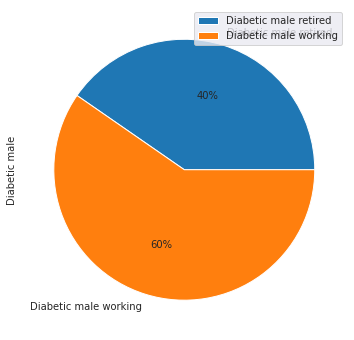

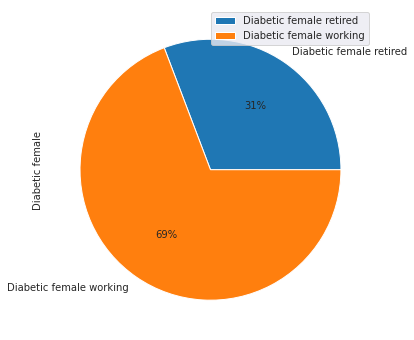

In [ ]:
male_work=male.loc[(male['Retired']!='Retired')&(male['Unemployed']!='Retired')]
female_work=female.loc[(female['Retired']!='Retired')&(female['Unemployed']!='Retired')]

print('Male working population who are diabetic:',len(male_work))
print('Female working population who are diabetic:',len(female_work))

dataframe = pd.DataFrame({'Name': ['Diabetic male working','Diabetic male retired'],
                          'Diabetic male': [65,44]})
dataframe.groupby(['Name']).sum().plot(
    kind='pie', y='Diabetic male', autopct='%1.0f%%',figsize=(8, 6))

dataframe = pd.DataFrame({'Name': ['Diabetic female working','Diabetic female retired'],
                          'Diabetic female': [63,28]})
dataframe.groupby(['Name']).sum().plot(
    kind='pie', y='Diabetic female', autopct='%1.0f%%',figsize=(6, 6))

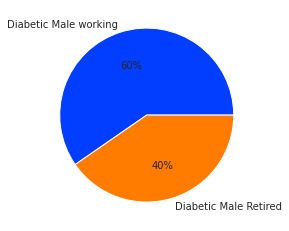

In [ ]:
import matplotlib.pyplot as plt
import seaborn

# declaring data
data = [65,44]
keys = ['Diabetic Male working', 'Diabetic Male Retired']

# define Seaborn color palette to use
palette_color = seaborn.color_palette('bright')

# plotting data on chart
plt.pie(data, labels=keys, colors=palette_color, autopct='%.0f%%')

# displaying chart
plt.show()

In [ ]:
male_health=male.loc[(male['Hypertension']=='Yes') &(male['Retired']!='Retired')]
len(male_health)

female_health=female.loc[(female['Hypertension']=='Yes') &(female['Retired']!='Retired')]
len(female_health)

30

# Data Preprocessing

In [ ]:
diab['Physical Check-up'].value_counts()
diab[diab['Physical Check-up'].isnull()==True]
diab.loc[(diab['Physical Check-up']=='Yes') & (diab['Arthritis']=='Yes')]
diab

,Survey ID,Age,Gender,Ethnicity,Marital Status,Education Completed,Household Size,No One,Spouse,Children,...,Social Networks (Non-city-based Ethnic),People (Non-city-based Ethnic),Other (Non-city-based Ethnic),Paper (Non-city-based General),TV/Radio (Non-city-based General),Website (Non-city-based General),Social Networks (Non-city-based General),People (Non-city-based General),Other (Non-city-based General),Preferred Type
2,1011601,23.0,Female,Chinese,Single,3.245186e+32,1.732051,0,0,0,...,No,Yes,No,No,No,No,No,Yes,No,email
9,10103,60.0,Female,Asian Indian,Single,1.667711e+33,1.732051,0,0,0,...,No,No,No,No,Yes,No,No,No,No,NaN
11,80505,43.0,Male,Vietnamese,Married,1.667711e+33,1.732051,0,0,Living with children,...,No,No,No,No,Yes,No,No,No,No,NaN
18,80121,46.0,Male,Vietnamese,Married,1.000000e+27,2.000000,0,Living with spouse,Living with children,...,No,No,No,No,No,No,No,No,No,NaN
23,11159,23.0,Male,Chinese,Living with a partner,1.000000e+27,1.000000,Living with no one,0,0,...,Yes,Yes,Yes,No,No,No,No,No,No,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2604,40223,70.0,Female,Other,Single,1.667711e+33,2.236068,0,0,Living with children,...,No,Yes,No,Yes,No,Yes,No,Yes,No,newsletter
2605,10330,68.0,Male,Other,Married,1.667711e+33,1.414214,0,Living with spouse,0,...,No,Yes,No,No,Yes,No,No,Yes,No,email
2606,11081000,76.0,Female,Filipino,Single,1.192533e+30,2.645751,0,0,Living with children,...,No,No,No,No,No,No,No,No,No,mail
2607,10953000,50.0,Male,Filipino,Single,1.667711e+33,2.000000,0,Living with spouse,0,...,No,Yes,No,No,No,Yes,No,No,No,website


In [ ]:
diab.isnull().sum()

Survey ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital Status                                0
Education Completed                           0
Household Size                                0
No One                                        1
Spouse                                        1
Children                                      1
Grand Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other Relative                                0
Friends                                       1
Religion                                      0
Full Time Employment                          3
Part Time Employment                          3
Self Employed Full Time                       0
Self Employed Part Time                 

# Imputing Present Mental Health and Health

In [ ]:
print(diab['Present Mental Health'].value_counts())
print(diab['Present Oral Health'].value_counts())
print(diab['Hygiene Assistance'].value_counts())
print(diab['Smoking'].value_counts())

print(diab['Drinking'].value_counts())

In [ ]:
diab['Quality of Life'].value_counts()

8.0     770
7.0     474
9.0     428
10.0    338
6.0     215
5.0     201
4.0      47
3.0      22
2.0      11
1.0       3
0.0       2
Name: Quality of Life, dtype: int64

In [ ]:
diab.loc[(diab['Present Mental Health'].isna()==True)&(diab['Quality of Life']<11.0)]
men=diab.loc[(diab['Present Mental Health'].isna()==True)]
men['Quality of Life']

diab.loc[(diab['Present Mental Health'].isna()==True)&(diab['Quality of Life']<=8.0), 'Present Mental Health']='Fair'

diab.loc[(diab['Present Mental Health'].isna()==True)&(diab['Quality of Life']<=10.0), 'Present Mental Health']='Excellent'


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
diab.dropna(subset=['Present_Health'],inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


# Imputing Present Oral Health


In [ ]:
print(diab['Present Oral Health'].isnull().sum())
diab['Dentist Check-up'].value_counts()

diab.loc[(diab['Present Oral Health'].isna()==True)&(diab['Dentist Check-up']=='Yes'),'Present Oral Health']= 'Fair'
print(diab['Present Oral Health'].value_counts())
diab.loc[(diab['Present Oral Health'].isna()==True),'Present Oral Health']= 'Very Good'

0
Very Good    891
Good         774
Excellent    421
Fair         348
Poor         104
Name: Present Oral Health, dtype: int64


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


# Imputing Hygiene Assistance


In [ ]:
print(diab['Hygiene_Assistance'].value_counts())
diab.loc[(diab['Hygiene_Assistance'].isna()==True)&(diab['Age']>60),'Hygiene_Assistance']=1

diab.isnull().sum()

0.0    2458
1.0      65
Name: Hygiene_Assistance, dtype: int64


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Survey_ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital_Status                                0
Education_Completed                           0
Household_Size                                0
No_One                                        1
Spouse                                        1
Children                                      1
Grand_Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other_Relative                                0
Friends                                       1
Religion                                      0
Full_Time_Employment                          3
Part_Time_Employment                          3
Self_Employed_Full_Time                       0
Self_Employed_Part_Time                 

# Imputing Regular Exercise, Healthy Diet, Hypertension,Arthritis

In [ ]:
#diab.loc[(diab['Regular_Exercise'].isna()==True)]
diab.columns = diab.columns.str.replace(' ','_')
diab.groupby(['Regular_Exercise','Present_Health'],dropna=False).Present_Health.count()
diab.loc[(diab['Present_Health']=='Very Good')&(diab['Regular_Exercise'].isna()==True),'Regular_Exercise']=1

diab['Regular_Exercise'].isnull().sum()
diab['Regular_Exercise'].mode()
diab.dropna(subset=['Regular_Exercise'],inplace=True)
diab.dropna(subset=['Healthy_Diet'],inplace=True)
diab.dropna(subset=['Hypertension'],inplace=True)
diab.dropna(subset=['Arthritis'],inplace=True)
diab.isnull().sum()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


Survey_ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital_Status                                0
Education_Completed                           0
Household_Size                                0
No_One                                        1
Spouse                                        1
Children                                      1
Grand_Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other_Relative                                0
Friends                                       1
Religion                                      0
Full_Time_Employment                          3
Part_Time_Employment                          3
Self_Employed_Full_Time                       0
Self_Employed_Part_Time                 

# Imputing missing values of Physical Check up and Dental Check up

In [ ]:
diab.loc[(diab['Physical_Check-up'].isna()==True)]
diab['Physical_Check-up'].value_counts()

diab.loc[(diab['Physical_Check-up'].isna()==True), 'Physical_Check-up']='Yes'
diab['Dentist_Check-up'].value_counts()

diab.loc[(diab['Dentist_Check-up'].isna()==True), 'Dentist_Check-up']='Yes'
diab.isnull().sum()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Survey_ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital_Status                                0
Education_Completed                           0
Household_Size                                0
No_One                                        1
Spouse                                        1
Children                                      1
Grand_Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other_Relative                                0
Friends                                       1
Religion                                      0
Full_Time_Employment                          3
Part_Time_Employment                          3
Self_Employed_Full_Time                       0
Self_Employed_Part_Time                 

#Imputing Unemployed

In [ ]:
diab.loc[(diab['Unemployed'].isna()==True)]
diab.loc[(diab['Unemployed'].isna()==True)&(diab['Age']<21),'Unemployed']='Unemployed'


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


#Imputing Other Employment and Occupation

In [ ]:
diab.drop(['Other_Employement'],axis=1,inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
diab.isnull().sum()

Survey_ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital_Status                                0
Education_Completed                           0
Household_Size                                0
No_One                                        1
Spouse                                        1
Children                                      1
Grand_Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other_Relative                                0
Friends                                       1
Religion                                      0
Full_Time_Employment                          3
Part_Time_Employment                          3
Self_Employed_Full_Time                       0
Self_Employed_Part_Time                 

In [ ]:
diab['Occupation'].value_counts()

diab.loc[(diab['Occupation'].isna()==True)&(diab['Income']=='$70,000 and over'),'Occupation']='Business owner'
diab.loc[(diab['Occupation'].isna()==True)&(diab['Income']=='$60,000 - $69,999'),'Occupation']='Professional'

diab.loc[(diab['Occupation'].isna()==True)&(diab['Income']=='$0 - $9,999'),'Occupation']='Other'
diab.loc[(diab['Occupation'].isna()==True)&(diab['Income']=='$10,000 - $19,999'),'Occupation']='Other'
diab.loc[(diab['Occupation'].isna()==True)&(diab['Income']=='$20,000 - $29,999'),'Occupation']='Service worker'
diab.loc[(diab['Occupation'].isna()==True)&(diab['Income']=='$30,000 - $39,999'),'Occupation']='Other'
diab.loc[(diab['Occupation'].isna()==True)&(diab['Income']=='$40,000 - $49,999'),'Occupation']='Professional'
diab.loc[(diab['Occupation'].isna()==True)&(diab['Income']=='$50,000 - $59,999'),'Occupation']='Professional'


#diab.drop(['Other_Employement'],axis=1,inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


#Imputing Health Insurance and Dental Insurance



In [ ]:

diab.loc[diab['Health_Insurance'].isna()==True]
diab.groupby(['Health_Insurance','Income'],dropna=False).Income.count()
diab.loc[(diab['Health_Insurance'].isna()==True),"Health_Insurance"]='Yes'
diab['Health_Insurance'].isnull().sum()

diab.loc[diab['Dental_Insurance'].isna()==True]
diab.groupby(['Dental_Insurance','Income'],dropna=False).Income.count()
diab.loc[(diab['Dental_Insurance'].isna()==True)&(diab['Income']=='$0 - $9,999'),"Dental_Insurance"]=0
diab.loc[(diab['Dental_Insurance'].isna()==True)&(diab['Income']=='$30,000 - $39,999'),"Dental_Insurance"]=0
diab.loc[(diab['Dental_Insurance'].isna()==True)&(diab['Income']=='$70,000 and over'),"Dental_Insurance"]='Yes'
diab.loc[(diab['Dental_Insurance'].isna()==True)&(diab['Income']=='$10,000 - $19,999'),"Dental_Insurance"]=0
diab.loc[(diab['Dental_Insurance'].isna()==True)&(diab['Income']=='$20,000 - $29,999'),"Dental_Insurance"]=0
diab.loc[(diab['Dental_Insurance'].isna()==True),"Dental_Insurance"]='Yes'

print(diab['Dental_Insurance'].isnull().sum())
print(diab['Health_Insurance'].isnull().sum())

diab.groupby(['Dental_Insurance','Income'],dropna=False).Income.count()

0
0


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Dental_Insurance  Income           
0                 $0 - $9,999            2
                  $10,000 - $19,999      1
                  $20,000 - $29,999      1
                  $30,000 - $39,999      2
                  $0 - $9,999          152
                  $10,000 - $19,999    142
                  $20,000 - $29,999    122
                  $30,000 - $39,999    112
                  $40,000 - $49,999     76
                  $50,000 - $59,999     74
                  $60,000 - $69,999     62
                  $70,000 and over     172
                  NaN                    0
Yes               $0 - $9,999           92
                  $10,000 - $19,999     54
                  $20,000 - $29,999     65
                  $30,000 - $39,999     86
                  $40,000 - $49,999     97
                  $50,000 - $59,999     96
                  $60,000 - $69,999    125
                  $70,000 and over     808
                  NaN                    0
Name: Income, dtyp

#Imputing Transportation for medical

In [ ]:
diab.isnull().sum()
diab.loc[diab['Transportation_(Medical)'].isna()==True]
diab.loc[(diab['Transportation_(Medical)'].isna()==True)&(diab['Age']>55),'Transportation_(Medical)']='Yes'
diab.loc[(diab['Transportation_(Medical)'].isna()==True),'Transportation_(Medical)']=0

diab.groupby(['Transportation_(Medical)','Income'],dropna=False).Income.count()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


Transportation_(Medical)  Income           
0                         $20,000 - $29,999      2
                          $30,000 - $39,999      1
                          $40,000 - $49,999      1
                          $60,000 - $69,999      1
                          $70,000 and over       3
                          $0 - $9,999          167
                          $10,000 - $19,999    135
                          $20,000 - $29,999    138
                          $30,000 - $39,999    166
                          $40,000 - $49,999    144
                          $50,000 - $59,999    136
                          $60,000 - $69,999    156
                          $70,000 and over     858
                          NaN                    0
Yes                       $0 - $9,999           79
                          $10,000 - $19,999     62
                          $20,000 - $29,999     48
                          $30,000 - $39,999     33
                          $40,000 - $4

# Imputing Medical Interpretation

In [ ]:
diab.loc[diab['Interpretation_(Medical)'].isna()==True]
diab['Interpretation_(Medical)'].value_counts()
diab.loc[(diab['Interpretation_(Medical)'].isna()==True),'Interpretation_(Medical)']=0
diab['Interpretation_(Medical)'].isnull().sum()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


0

In [ ]:
diab.isnull().sum()

Survey_ID                                     0
Age                                           0
Gender                                        0
Ethnicity                                     0
Marital_Status                                0
Education_Completed                           0
Household_Size                                0
No_One                                        1
Spouse                                        1
Children                                      1
Grand_Children                                1
Parent                                        1
Grandparent                                   0
Brother/Sister                                1
Other_Relative                                0
Friends                                       1
Religion                                      0
Full_Time_Employment                          3
Part_Time_Employment                          3
Self_Employed_Full_Time                       0
Self_Employed_Part_Time                 

In [ ]:
diab.iloc[:,63:213]

# Imputing Urgent Care, Folkmedicine, Primary care

In [ ]:
diab['Urgentcare'].value_counts()

diab.loc[(diab['Urgentcare'].isna()==True),'Urgentcare']='Yes'

In [ ]:
diab['Folkmedicine'].value_counts()
diab.loc[(diab['Folkmedicine'].isna()==True),'Folkmedicine']='Yes'

In [ ]:
diab['Primary_Care'].value_counts()

diab.loc[(diab['Primary_Care'].isna()==True),'Primary_Care']='Yes'

In [ ]:
import pandas as pd

diab = pd.read_csv(r'/content/drive/MyDrive/diab.csv')

diab

,Unnamed: 0,Survey_ID,Age,Gender,Ethnicity,Marital_Status,Education_Completed,Household_Size,No_One,Spouse,...,Social_Networks_(Non-city-based_Ethnic),People_(Non-city-based_Ethnic),Other_(Non-city-based_Ethnic),Paper_(Non-city-based_General),TV/Radio_(Non-city-based_General),Website_(Non-city-based_General),Social_Networks_(Non-city-based_General),People_(Non-city-based_General),Other_(Non-city-based_General),Preferred_Type
0,2,1011601,23.0,Female,Chinese,Single,3.245186e+32,1.732051,0,0,...,No,Yes,No,No,No,No,No,Yes,No,email
1,9,10103,60.0,Female,Asian Indian,Single,1.667711e+33,1.732051,0,0,...,No,No,No,No,Yes,No,No,No,No,NaN
2,11,80505,43.0,Male,Vietnamese,Married,1.667711e+33,1.732051,0,0,...,No,No,No,No,Yes,No,No,No,No,NaN
3,18,80121,46.0,Male,Vietnamese,Married,1.000000e+27,2.000000,0,Living with spouse,...,No,No,No,No,No,No,No,No,No,NaN
4,23,11159,23.0,Male,Chinese,Living with a partner,1.000000e+27,1.000000,Living with no one,0,...,Yes,Yes,Yes,No,No,No,No,No,No,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2517,2604,40223,70.0,Female,Other,Single,1.667711e+33,2.236068,0,0,...,No,Yes,No,Yes,No,Yes,No,Yes,No,newsletter
2518,2605,10330,68.0,Male,Other,Married,1.667711e+33,1.414214,0,Living with spouse,...,No,Yes,No,No,Yes,No,No,Yes,No,email
2519,2606,11081000,76.0,Female,Filipino,Single,1.192533e+30,2.645751,0,0,...,No,No,No,No,No,No,No,No,No,mail
2520,2607,10953000,50.0,Male,Filipino,Single,1.667711e+33,2.000000,0,Living with spouse,...,No,Yes,No,No,No,Yes,No,No,No,website


# Impute Unmeet health needs and unmeet dental needs

In [ ]:
diab['Unmet_Dental_Needs'].value_counts()
diab.loc[(diab['Unmet_Dental_Needs']==0),'Unmet_Dental_Needs']='0'

In [ ]:
diab['Unmet_Health_Need'].value_counts()
diab.loc[(diab['Unmet_Health_Need'].isna()==True),'Unmet_Health_Need']='0'

# Imputing Communication problem and Preferance

In [ ]:
diab['Comunication_Problem'].value_counts()
diab.loc[(diab['Comunication_Problem'].isna()==True),'Comunication_Problem']='0'

In [ ]:
print(diab['Preferance'].value_counts())
diab.loc[(diab['Preferance'].isnull()==True)]
diab.groupby(['Preference','Ethnicity'],dropna=False).Preferance.count()

diab.loc[(diab['Ethnicity']=='Asian Indian')&(diab['Preferance'].isnull()==True),'Preferance']=0
diab.loc[(diab['Ethnicity']=='Chinese')&(diab['Preferance'].isnull()==True),'Preferance']='Yes'
diab.loc[(diab['Ethnicity']=='Filipino')&(diab['Preferance'].isnull()==True),'Preferance']=0
diab.loc[(diab['Ethnicity']=='Korean')&(diab['Preferance'].isnull()==True),'Preferance']='Yes'
diab.loc[(diab['Ethnicity']=='Other')&(diab['Preferance'].isnull()==True),'Preferance']=0
diab.loc[(diab['Ethnicity']=='Vietnamese')&(diab['Preferance'].isnull()==True),'Preferance']='Yes'

diab.loc[(diab['Preferance']==0),'Preferance']='0'

Yes    1302
0      1220
Name: Preferance, dtype: int64


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

diab=pd.read_csv(r'/content/drive/MyDrive/diab_imputed.csv')
diab.drop(columns=['Unnamed: 0','Unnamed: 0.1'],axis=0)

,Survey_ID,Age,Gender,Ethnicity,Marital_Status,Education_Completed,Household_Size,No_One,Spouse,Children,...,People_(Non-city-based_Ethnic),Other_(Non-city-based_Ethnic),Paper_(Non-city-based_General),TV/Radio_(Non-city-based_General),Website_(Non-city-based_General),Social_Networks_(Non-city-based_General),People_(Non-city-based_General),Other_(Non-city-based_General),Preferred_Type,Unmet_Health_Needs
0,1011601,23.0,Female,Chinese,Single,3.245186e+32,1.732051,0,0,0,...,Yes,No,No,No,No,No,Yes,No,email,NaN
1,10103,60.0,Female,Asian Indian,Single,1.667711e+33,1.732051,0,0,0,...,No,No,No,Yes,No,No,No,No,NaN,NaN
2,80505,43.0,Male,Vietnamese,Married,1.667711e+33,1.732051,0,0,Living with children,...,No,No,No,Yes,No,No,No,No,NaN,NaN
3,80121,46.0,Male,Vietnamese,Married,1.000000e+27,2.000000,0,Living with spouse,Living with children,...,No,No,No,No,No,No,No,No,NaN,NaN
4,11159,23.0,Male,Chinese,Living with a partner,1.000000e+27,1.000000,Living with no one,0,0,...,Yes,Yes,No,No,No,No,No,No,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2517,40223,70.0,Female,Other,Single,1.667711e+33,2.236068,0,0,Living with children,...,Yes,No,Yes,No,Yes,No,Yes,No,newsletter,NaN
2518,10330,68.0,Male,Other,Married,1.667711e+33,1.414214,0,Living with spouse,0,...,Yes,No,No,Yes,No,No,Yes,No,email,NaN
2519,11081000,76.0,Female,Filipino,Single,1.192533e+30,2.645751,0,0,Living with children,...,No,No,No,No,No,No,No,No,mail,NaN
2520,10953000,50.0,Male,Filipino,Single,1.667711e+33,2.000000,0,Living with spouse,0,...,Yes,No,No,No,Yes,No,No,No,website,NaN


In [ ]:
s=diab.pop('Diabetes')
diab.insert(215,'Diabetes',s)

x=diab.iloc[:,2:215]
y=diab.iloc[:,215]

#One Hot Encoding/ creating dummy features

In [ ]:
ohe_diab = pd.get_dummies(diab, columns = ['Gender'],drop_first=True)
ohe_diab

,Unnamed: 0,Unnamed: 0.1,Survey_ID,Age,Ethnicity,Marital_Status,Education_Completed,Household_Size,No_One,Spouse,...,Other_(Non-city-based_Ethnic),Paper_(Non-city-based_General),TV/Radio_(Non-city-based_General),Website_(Non-city-based_General),Social_Networks_(Non-city-based_General),People_(Non-city-based_General),Other_(Non-city-based_General),Preferred_Type,Unmet_Health_Needs,Gender_Male
0,0,2,1011601,23.0,Chinese,Single,3.245186e+32,1.732051,0,0,...,No,No,No,No,No,Yes,No,email,NaN,0
1,1,9,10103,60.0,Asian Indian,Single,1.667711e+33,1.732051,0,0,...,No,No,Yes,No,No,No,No,NaN,NaN,0
2,2,11,80505,43.0,Vietnamese,Married,1.667711e+33,1.732051,0,0,...,No,No,Yes,No,No,No,No,NaN,NaN,1
3,3,18,80121,46.0,Vietnamese,Married,1.000000e+27,2.000000,0,Living with spouse,...,No,No,No,No,No,No,No,NaN,NaN,1
4,4,23,11159,23.0,Chinese,Living with a partner,1.000000e+27,1.000000,Living with no one,0,...,Yes,No,No,No,No,No,No,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2517,2517,2604,40223,70.0,Other,Single,1.667711e+33,2.236068,0,0,...,No,Yes,No,Yes,No,Yes,No,newsletter,NaN,0
2518,2518,2605,10330,68.0,Other,Married,1.667711e+33,1.414214,0,Living with spouse,...,No,No,Yes,No,No,Yes,No,email,NaN,1
2519,2519,2606,11081000,76.0,Filipino,Single,1.192533e+30,2.645751,0,0,...,No,No,No,No,No,No,No,mail,NaN,0
2520,2520,2607,10953000,50.0,Filipino,Single,1.667711e+33,2.000000,0,Living with spouse,...,No,No,No,Yes,No,No,No,website,NaN,1


In [ ]:
#diab['Gender'] = diab['Gender'].astype(float)

from sklearn import preprocessing
le = preprocessing.LabelEncoder()
X = le.fit_transform(diab['Gender'])

In [ ]:
diab.to_csv('diab_imputed.csv')

#Imputing missing values in members of household

In [ ]:
m=diab.select_dtypes(exclude=['object']).columns.tolist()
noncat_diab=diab.drop(columns=m,axis=1,inplace=False)

len(noncat_diab.columns)

181

In [ ]:
import pandas as pd

pd.set_option('display.max_rows', 500)
diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       1
Grand_Children                                 1
Parent                                         1
Grandparent                                    0
Brother/Sister                                 1
Other_Relative                                 0
Friends                                        1
Religion                                       0
Full_Time_Employment                           3
Part_Time_Employment

In [ ]:


diab.loc[(diab['Children'].isnull()==True),'Children']=0
diab.loc[(diab['Grand_Children'].isna()==True),'Grand_Children']=0
diab.loc[(diab['Parent'].isna()==True),'Parent']=0
diab.loc[(diab['Grandparent'].isna()==True),'Grandparent']=0
diab.loc[(diab['Brother/Sister'].isna()==True),'Brother/Sister']=0
diab.loc[(diab['Friends'].isna()==True),'Friends']=0
diab.loc[(diab['Unemployed'].isna()==True),'Unemployed']='Unemployed'
diab.loc[(diab['Full_Time_Employment'].isna()==True),'Full_Time_Employment']=0
diab.loc[(diab['Part_Time_Employment'].isna()==True),'Part_Time_Employment']=0

#Imputing Source of Health Information

In [ ]:
f=diab['Family'].mode()
print(diab['Close_Friend'].mode())
print(diab['Acquaintances'].mode())
print(diab['Heal_Professionals'].mode())
print(diab['Mobile_Apps'].mode())
print(diab['Email'].mode())
print(diab['Social_Networks'].mode())
print(diab['Online_Communities'].mode())
print(diab['Health_Website'].mode())


diab.loc[(diab['Family'].isnull()==True),'Family']='Yes'
diab.loc[(diab['Close_Friend'].isnull()==True),'Close_Friend']='No'
diab.loc[(diab['Acquaintances'].isnull()==True),'Acquaintances']='No'
diab.loc[(diab['Heal_Professionals'].isnull()==True),'Heal_Professionals']='No'
diab.loc[(diab['Mobile_Apps'].isnull()==True),'Mobile_Apps']='No'
diab.loc[(diab['Email'].isnull()==True),'Email']='No'
diab.loc[(diab['Social_Networks'].isnull()==True),'Social_Networks']='No'
diab.loc[(diab['Online_Communities'].isnull()==True),'Online_Communities']='No'
diab.loc[(diab['Health_Website'].isnull()==True),'Health_Website']='No'
diab.isnull().sum()

0    No
dtype: object
0    No
dtype: object
0    No
dtype: object
0    No
dtype: object
0    No
dtype: object
0    No
dtype: object
0    No
dtype: object
0    No
dtype: object


Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment

In [ ]:
diab['Source_of_Health_Information'].value_counts()
diab.loc[(diab['Source_of_Health_Information'].isnull()==True),'Source_of_Health_Information']=0

diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment

#Imputing quality of Life

In [ ]:
diab['Quality_of_Life'].value_counts()
diab.loc[(diab['Quality_of_Life'].isnull()==True)]

diab.loc[(diab['Quality_of_Life'].isnull()==True),'Quality_of_Life']=8.0

diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment

#Categorical features (Step1)

In [ ]:
diab_cat=diab.select_dtypes(include=['object'])
#cat_diab=diab.drop(columns=m,axis=1,inplace=False)
diab_cat_ohe=pd.get_dummies(diab_cat,drop_first=True)
pd.set_option('display.max_rows', 5000)

diab_num=diab.select_dtypes(exclude=['object'])

diab_cat_ohe.isnull().sum()

In [ ]:
diab_final = pd.concat([diab_num, diab_cat_ohe], axis=1)

diab_final['Diabetes_Yes']

shiftPos = diab_final.pop("Diabetes_Yes")
diab_final.insert(1043, "Diabetes", shiftPos)

diab_final

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2822: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  if self.run_code(code, result):


,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Survey_ID,Age,Education_Completed,Household_Size,Achieving_Ends_Meet,Duration_of_Residency,Primary_Language,...,"Preferred_Type_website, newspaper","Preferred_Type_website, newspaper, radio, TV","Preferred_Type_website, online","Preferred_Type_website, social network","Preferred_Type_website, twitter",Preferred_Type_wechat,"Preferred_Type_wechat, internet",Preferred_Type_weibo,"Preferred_Type_weibo, wechat",Diabetes
0,0,0,2,1011601,23.00000,3.245186e+32,1.732051,0.0,11.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
1,1,1,9,10103,60.00000,1.667711e+33,1.732051,0.0,47.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
2,2,2,11,80505,43.00000,1.667711e+33,1.732051,0.0,30.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
3,3,3,18,80121,46.00000,1.000000e+27,2.000000,0.0,21.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
4,4,4,23,11159,23.00000,1.000000e+27,1.000000,1.0,23.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
5,5,5,24,10258,36.00000,1.192533e+30,2.000000,0.0,15.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
6,6,6,25,50208,68.00000,8.819764e+30,2.449490,0.0,15.606589,1.0,...,0,0,0,0,0,0,0,0,0,0
7,7,7,26,50192,49.00000,3.245186e+32,2.000000,0.0,4.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
8,8,8,27,60183,75.00000,3.245186e+32,1.414214,1.0,20.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
9,9,9,28,50010,76.00000,3.245186e+32,2.449490,0.0,15.606589,1.0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
diab_f1=diab_final.drop(columns=['Psychiatrist','Therapist/Counselor_','See_Family','Close_Family','Helpful_Family','Residency_','Other_Transportation','Unmet_Health_Needs'],axis=0,inplace=False)

In [ ]:
diab_f1.isnull().sum()

Unnamed: 0                                                                              0
Unnamed: 0.1                                                                            0
Unnamed: 0.1.1                                                                          0
Survey_ID                                                                               0
Age                                                                                     0
Education_Completed                                                                     0
Household_Size                                                                          0
Achieving_Ends_Meet                                                                     0
Duration_of_Residency                                                                   0
Primary_Language                                                                        0
Hygiene_Assistance                                                                      0
Smoking   

In [ ]:
diab_f1.drop(columns=['See_Friends','Close_Friends','Helpful_Friends'],inplace=True,axis=1)

In [ ]:
import numpy as np
#np.isnan(diab_f1).sum()
np.isfinite(diab_f1).sum()

Unnamed: 0                                                                            2522
Unnamed: 0.1                                                                          2522
Unnamed: 0.1.1                                                                        2522
Survey_ID                                                                             2522
Age                                                                                   2522
Education_Completed                                                                   2522
Household_Size                                                                        2522
Achieving_Ends_Meet                                                                   2522
Duration_of_Residency                                                                 2522
Primary_Language                                                                      2522
Hygiene_Assistance                                                                    2522

In [ ]:
diab_f2= diab_f1.dropna(axis=1)
diab_f2.isnull().sum()

diab_f2.iloc[:,1010:1024]

,"Preferred_Type_website, newspaper, radio, TV","Preferred_Type_website, online","Preferred_Type_website, social network","Preferred_Type_website, twitter",Preferred_Type_wechat,"Preferred_Type_wechat, internet",Preferred_Type_weibo,"Preferred_Type_weibo, wechat"
0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0


In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())



#Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train, y_train)
y_pred= lr.predict(x_test)

score = lr.score(x_test, y_test)
print(score)

0.5055986218776917


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics

cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

[[587   0]
 [574   0]]


#Feature Selection using SelectKBest

In [ ]:
diab_f2.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'],axis=0,inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
diab_f2.columns

Index(['Unnamed: 0.1.1', 'Survey_ID', 'Age', 'Education_Completed',
       'Household_Size', 'Achieving_Ends_Meet', 'Duration_of_Residency',
       'Primary_Language', 'Hygiene_Assistance', 'Smoking',
       ...
       'Preferred_Type_website, newspaper',
       'Preferred_Type_website, newspaper, radio, TV',
       'Preferred_Type_website, online',
       'Preferred_Type_website, social network',
       'Preferred_Type_website, twitter', 'Preferred_Type_wechat',
       'Preferred_Type_wechat, internet', 'Preferred_Type_weibo',
       'Preferred_Type_weibo, wechat', 'Diabetes'],
      dtype='object', length=1017)

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
x=diab_f2.iloc[:,0:1022]
y=diab_f2.iloc[:,1022]
select = SelectKBest(score_func=chi2, k=20)
x_n = select.fit_transform(x, y)
x_n.shape
cols = select.get_support(indices=True)
db1 = diab_f2.iloc[:,cols]

print(db1.columns)


(4644, 20)


#Logistic Regression with 20 top features

In [ ]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train, y_train)
y_pred= lr.predict(x_test)

score = lr.score(x_test, y_test)
print(score)
from sklearn.metrics import accuracy_score
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

0.9267707082833133
Model accuracy score: 0.9268
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       772
           1       0.00      0.00      0.00        61

    accuracy                           0.93       833
   macro avg       0.46      0.50      0.48       833
weighted avg       0.86      0.93      0.89       833



/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels wi

In [ ]:
diab_f2.isnull().sum()

In [ ]:
from sklearn.impute import KNNImputer

#diab.insert(213,'Diabetes',col)
diab_f1.iloc[:,14:21]
X, y = diab_f1.iloc[:,14:21], diab_f1.iloc[:,22:1044]
imputer = KNNImputer()
# fit on the dataset
imputer.fit(X)
# transform the dataset
Xtrans = imputer.transform(X)

In [ ]:
cat = [ 'job', 'marital', 'education', 'default',
        'housing', 'loan', 'contact', 'month',
        'poutcome']
for col in cat:
    plt.figure(figsize=(10,4))
    #Returns cozsunts of unique values for each outcome for each feature.
    pos_counts = train.loc[train_df.Category.values == 'yes', col].value_counts()
    neg_counts = train.loc[train_df.Category.values == 'no', col].value_counts()

    all_counts = list(set(list(pos_counts.index) + list(neg_counts.index)))

    #Counts of how often each outcome was recorded.
    freq_pos = (train_df.Category.values == 'yes').sum()
    freq_neg = (train_df.Category.values == 'no').sum()

    pos_counts = pos_counts.to_dict()
    neg_counts = neg_counts.to_dict()

    all_index = list(all_counts)
    all_counts = [pos_counts.get(k, 0) / freq_pos - neg_counts.get(k, 0) / freq_neg for k in all_counts]

    sns.barplot(all_counts, all_index)
    plt.title(col)
    plt.tight_layout()

In [ ]:
train_df.loc[(train_df['education']=='unknown') & (train_df['job']=='management'), 'education'] = 'tertiary'
train_df.loc[(train_df['education']=='unknown') & (train_df['job']=='services'), 'education'] = 'secondary'
train_df.loc[(train_df['education']=='unknown') & (train_df['job']=='housemaid'), 'education'] = 'primary'
train_df.loc[(train_df['job'] == 'unknown') & (train_df['education']=='tertiary'), 'job'] = 'management'

train_df.loc[(train_df['education']=='unknown') & (train_df['job']=='admin.'), 'education'] = 'secondary'
train_df.loc[(train_df['education']=='unknown') & (train_df['job']=='blue-collar'), 'education'] = 'secondary'
train_df.loc[(train_df['education']=='unknown') & (train_df['job']=='technician'), 'education'] = 'secondary'

train_df.loc[(train_df['job'] == 'unknown') & (train_df['education']=='secondary'), 'job'] = 'blue-collar'
train_df.loc[(train_df['job'] == 'unknown') & (train_df['education']=='primary'), 'job'] = 'blue-collar'
train_df.loc[(train_df['age']>60) & (train_df['job']=='unknown'), 'job'] = 'retired'
#train_df.loc[(train_df['job']=='unknown') & (train_df['education']=='professional.course'), 'job'] = 'technician'

#Imputing Satisfied_with_life_1 and  Satisfied_with_life_2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

diab=pd.read_csv(r'/content/drive/MyDrive/diab_imputed.csv')

In [ ]:
pd.set_option('display.max_rows', 500)
diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment

In [ ]:
diab['Satisfied_With_Life_1'].value_counts()

Agree                        973
Slightly agree               631
Neither agree or disagree    429
Strongly agree               227
Slightly disagree            141
Disagree                      81
Strongly disagree             40
Name: Satisfied_With_Life_1, dtype: int64

In [ ]:
diab['Satisfied_With_Life_1']=diab['Satisfied_With_Life_1'].fillna(method='bfill')
diab['Satisfied_With_Life_1'].isnull().sum()

diab['Satisfied_With_Life_2']=diab['Satisfied_With_Life_2'].fillna(method='bfill')
diab['Satisfied_With_Life_2'].isnull().sum()

0

#Imputing values in Psychiatrist, General Practitioner, Therapist/Counsellor, Religious Leader

In [ ]:
mh=diab.loc[(diab['Psychiatrist'].isnull()==True)]
diab.groupby(['Psychiatrist','Present_Health'],dropna=False).Present_Health.count()

Psychiatrist  Present_Health
0.0           Excellent         518
              Fair              223
              Good              768
              Poor               37
              Very Good         976
Name: Present_Health, dtype: int64

In [ ]:
diab['Psychiatrist']=diab['Psychiatrist'].fillna(method='bfill')
diab.isnull().sum()

#diab['Satisfied_With_Life_2']=diab['Satisfied_With_Life_2'].fillna(method='bfill')
#diab['Satisfied_With_Life_2'].isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment

In [ ]:
diab['General_Practitioner']=diab['General_Practitioner'].fillna(method='bfill')
diab['General_Practitioner'].isnull().sum()

diab['Therapist/Counselor_']=diab['Therapist/Counselor_'].fillna(method='bfill')
diab['Therapist/Counselor_'].isnull().sum()

diab['Religious_Leader']=diab['Religious_Leader'].fillna(method='bfill')
diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment

#Imputing missing values in Weakness, Shame, Disappoinment, Disclosure, Antidepressants, Danger, Recovery, Treatment, Counseling,preference

In [ ]:
diab['Antidepressants'].value_counts()

diab['Weakness']=diab['Weakness'].fillna(method='bfill')
diab['Shame']=diab['Shame'].fillna(method='bfill')
diab['Disappointment']=diab['Disappointment'].fillna(method='bfill')
diab['Disclosure']=diab['Disclosure'].fillna(method='bfill')
diab['Antidepressants']=diab['Antidepressants'].fillna(method='bfill')
diab['Danger']=diab['Danger'].fillna(method='bfill')
diab['Recovery']=diab['Recovery'].fillna(method='bfill')
diab['Treatment']=diab['Treatment'].fillna(method='bfill')
diab['Counseling']=diab['Counseling'].fillna(method='bfill')
diab['Preference']=diab['Preference'].fillna(method='bfill')

In [ ]:
diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment

# Imputing Missing values in Knowledge, Diagnosed, Concern_for_Self_(AD),Concer_for_Others(AD), Prevention, Plan_(AD), Education_(AD), Services_(AD),Language_Barrier_(AD), Fate_(AD), Aging_(AD), Embarrasing_(AD), Avoidance_(AD), Cure_(AD), Nursing_Home(AD)

In [ ]:
diab['Knowledge']=diab['Knowledge'].fillna(method='bfill')
diab['Diagnosed']=diab['Diagnosed'].fillna(method='bfill')
diab['Concern_for_Self_(AD)']=diab['Concern_for_Self_(AD)'].fillna(method='bfill')
diab['Concern_for_Others_(AD)']=diab['Concern_for_Others_(AD)'].fillna(method='bfill')
diab['Prevention']=diab['Prevention'].fillna(method='bfill')
diab['Plan_(AD)']=diab['Plan_(AD)'].fillna(method='bfill')
diab['Education_(AD)']=diab['Education_(AD)'].fillna(method='bfill')
diab['Services_(AD)']=diab['Services_(AD)'].fillna(method='bfill')
diab['Language_Barrier_(AD)']=diab['Language_Barrier_(AD)'].fillna(method='bfill')
diab['Fate_(AD)']=diab['Fate_(AD)'].fillna(method='bfill')

In [ ]:
diab['Aging_(AD)']=diab['Aging_(AD)'].fillna(method='bfill')
diab['Embarrassing_(AD)']=diab['Embarrassing_(AD)'].fillna(method='bfill')
diab['Avoidance_(AD)']=diab['Avoidance_(AD)'].fillna(method='bfill')
diab['Cure_(AD)']=diab['Cure_(AD)'].fillna(method='bfill')
diab['Nursing_Home_(AD)']=diab['Nursing_Home_(AD)'].fillna(method='bfill')

In [ ]:
diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment

In [ ]:
diab.to_csv('diab_imputed.csv')

#Imputing Advanced_Directives, Have_an_Advanced_Directive, Superstition, See_Family, close_Family

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd

diab=pd.read_csv(r'/content/drive/MyDrive/diab_imputed (1).csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pd.set_option('display.max_rows', 500)
diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Unnamed: 0.1.1                                 0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment

In [ ]:
diab.drop(columns=['Unnamed: 0','Unnamed: 0.1','Unnamed: 0.1.1'],axis=0)

In [ ]:
diab['Advanced_Directives']=diab['Advanced_Directives'].fillna(method='bfill')
diab['Have_an_Advanced_Directive']=diab['Have_an_Advanced_Directive'].fillna(method='bfill')
diab['Superstition']=diab['Superstition'].fillna(method='bfill')
diab['See_Family']=diab['See_Family'].fillna(method='bfill')
diab['Close_Family']=diab['Close_Family'].fillna(method='bfill')

diab.isnull().sum()

#Imputing missing values in Helpful_Family,See_Friends, Close_Friends, Helpful_Friends, See_Friends, Family_Respect

In [ ]:
diab['Helpful_Family']=diab['Helpful_Family'].fillna(method='bfill')
diab['See_Friends']=diab['See_Friends'].fillna(method='bfill')
diab['Close_Friends']=diab['Close_Friends'].fillna(method='bfill')
diab['Helpful_Friends']=diab['Helpful_Friends'].fillna(method='bfill')
diab['Family_Respect']=diab['Family_Respect'].fillna(method='bfill')
diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Unnamed: 0.1.1                                 0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment

#Imputing missing values in Similar_Values, Successful_Family, Trust, Loyalty, Family_Pride, Expression, Spend_Time_Together, Feel_Close_, Togetherness, Religious_Attendance, Religious_Importance

In [ ]:
diab['Similar_Values']=diab['Similar_Values'].fillna(method='bfill')
diab['Successful_Family']=diab['Successful_Family'].fillna(method='bfill')
diab['Trust']=diab['Trust'].fillna(method='bfill')
diab['Loyalty']=diab['Loyalty'].fillna(method='bfill')
diab['Family_Pride']=diab['Family_Pride'].fillna(method='bfill')
diab['Expression']=diab['Expression'].fillna(method='bfill')
diab['Spend_Time_Together']=diab['Spend_Time_Together'].fillna(method='bfill')
diab['Feel_Close_']=diab['Feel_Close_'].fillna(method='bfill')
diab['Togetherness']=diab['Togetherness'].fillna(method='bfill')
diab['Religious_Attendance']=diab['Religious_Attendance'].fillna(method='bfill')
diab['Religious_Importance']=diab['Religious_Importance'].fillna(method='bfill')
diab.isnull().sum()

Unnamed: 0                                     0
Unnamed: 0.1                                   0
Unnamed: 0.1.1                                 0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment

#Imputing missing values in Close-knit_Community,Helpful_Community, Community_Shares_Values, Get_Along, Community_Trust, Residency, Place_to_Live, Raising_Children, Place_to_Work

In [ ]:
diab['Close-knit_Community']=diab['Close-knit_Community'].fillna(method='bfill')
diab['Helpful_Community']=diab['Helpful_Community'].fillna(method='bfill')
diab['Community_Shares_Values']=diab['Community_Shares_Values'].fillna(method='bfill')
diab['Get_Along']=diab['Get_Along'].fillna(method='bfill')
diab['Community_Trust']=diab['Community_Trust'].fillna(method='bfill')
diab['Residency_']=diab['Residency_'].fillna(method='bfill')
diab['Place_to_Live']=diab['Place_to_Live'].fillna(method='bfill')
diab['Place_to_Work']=diab['Place_to_Work'].fillna(method='bfill')
diab['Raising_Children']=diab['Raising_Children'].fillna(method='bfill')

In [ ]:
diab.to_csv('imputed_diab.csv')

In [ ]:
diab['Age']

42.54311622935558

In [ ]:
diab['Age'].var()

288.3216327462838

#Decision Trees with all features(first one) and top 20 Fetaures(second one) and top 10 features(Third one)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd

diab=pd.read_csv(r'/content/drive/MyDrive/diab_imputed (1).csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
diab_c=diab.select_dtypes(include=['object'])
#cat_diab=diab.drop(columns=m,axis=1,inplace=False)
diab_c_ohe=pd.get_dummies(diab_c,drop_first=True)
pd.set_option('display.max_rows', 5000)

diab_n=diab.select_dtypes(exclude=['object'])

diab_c_ohe['Diabetes_Yes']

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10       True
11      False
12      False
13      False
14       True
15      False
16      False
17      False
18      False
19      False
20       True
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28       True
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40       True
41      False
42       True
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51       True
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [ ]:
diab_final = pd.concat([diab_n, diab_c_ohe], axis=1)

diab_final['Diabetes_Yes']

shiftPos = diab_final.pop("Diabetes_Yes")
diab_final.insert(1036, "Diabetes", shiftPos)

diab_final

In [ ]:
diab_f1=diab_final.drop(columns=['Psychiatrist','Therapist/Counselor_','See_Family','Close_Family','Helpful_Family','Residency_','Other_Transportation','Unmet_Health_Needs'],axis=0,inplace=False)

In [ ]:
diab_f1.drop(columns=['See_Friends','Close_Friends','Helpful_Friends'],inplace=True,axis=1)

In [ ]:
diab_f2= diab_f1.dropna(axis=1)
diab_f2.shape

(2522, 1019)

In [ ]:
diab_f2.iloc[:,0:1018]

,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,Survey_ID,Age,Education_Completed,Household_Size,Achieving_Ends_Meet,Duration_of_Residency,Primary_Language,...,"Preferred_Type_website, mobile phone","Preferred_Type_website, newspaper","Preferred_Type_website, newspaper, radio, TV","Preferred_Type_website, online","Preferred_Type_website, social network","Preferred_Type_website, twitter",Preferred_Type_wechat,"Preferred_Type_wechat, internet",Preferred_Type_weibo,Diabetes
0,0,0,2,1011601,23.00000,3.245186e+32,1.732051,0.0,11.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
1,1,1,9,10103,60.00000,1.667711e+33,1.732051,0.0,47.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
2,2,2,11,80505,43.00000,1.667711e+33,1.732051,0.0,30.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
3,3,3,18,80121,46.00000,1.000000e+27,2.000000,0.0,21.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
4,4,4,23,11159,23.00000,1.000000e+27,1.000000,1.0,23.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
5,5,5,24,10258,36.00000,1.192533e+30,2.000000,0.0,15.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
6,6,6,25,50208,68.00000,8.819764e+30,2.449490,0.0,15.606589,1.0,...,0,0,0,0,0,0,0,0,0,0
7,7,7,26,50192,49.00000,3.245186e+32,2.000000,0.0,4.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
8,8,8,27,60183,75.00000,3.245186e+32,1.414214,1.0,20.000000,1.0,...,0,0,0,0,0,0,0,0,0,0
9,9,9,28,50010,76.00000,3.245186e+32,2.449490,0.0,15.606589,1.0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
x=diab_f2.iloc[:,0:1017]
y=diab_f2.iloc[:,1017]

sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())
x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.25, random_state=0)

from sklearn.tree import DecisionTreeClassifier
clr= DecisionTreeClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))



Model accuracy score with criterion entropy: 0.9311
              precision    recall  f1-score   support

           0       0.94      0.92      0.93       587
           1       0.92      0.94      0.93       574

    accuracy                           0.93      1161
   macro avg       0.93      0.93      0.93      1161
weighted avg       0.93      0.93      0.93      1161



In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
x=diab_f2.iloc[:,0:1017]
y=diab_f2.iloc[:,1017]

sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())

select = SelectKBest(score_func=chi2, k=20)
x_n = select.fit_transform(X, y)
x_n.shape
cols = select.get_support(indices=True)
db1 = X.iloc[:,cols]

In [ ]:
from sklearn.model_selection import train_test_split

x=db1
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.33, random_state=0)
from sklearn.tree import DecisionTreeClassifier
classifier= DecisionTreeClassifier(criterion='entropy', random_state=0)
classifier.fit(x_train, y_train)

y_pred= classifier.predict(x_test)
from sklearn.metrics import accuracy_score
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))

Model accuracy score with criterion entropy: 0.9028
              precision    recall  f1-score   support

           0       0.91      0.90      0.90       772
           1       0.90      0.91      0.90       761

    accuracy                           0.90      1533
   macro avg       0.90      0.90      0.90      1533
weighted avg       0.90      0.90      0.90      1533



In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
x=diab_f2.iloc[:,0:1017]
y=diab_f2.iloc[:,1017]

sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())

select = SelectKBest(score_func=chi2, k=10)
x_n = select.fit_transform(X, y)
x_n.shape
cols = select.get_support(indices=True)
db1 = X.iloc[:,cols]

In [ ]:
from sklearn.model_selection import train_test_split

x=db1
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.33, random_state=0)
from sklearn.tree import DecisionTreeClassifier
classifier= DecisionTreeClassifier(criterion='entropy', random_state=0)
classifier.fit(x_train, y_train)

y_pred= classifier.predict(x_test)
from sklearn.metrics import accuracy_score
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))

Model accuracy score with criterion entropy: 0.9067
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       772
           1       0.90      0.92      0.91       761

    accuracy                           0.91      1533
   macro avg       0.91      0.91      0.91      1533
weighted avg       0.91      0.91      0.91      1533



#Logistic Regression with all features and FS

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
x=diab_f2.iloc[:,0:1017]
y=diab_f2.iloc[:,1017]

sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())
x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)

from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train, y_train)

y_pred= lr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Model accuracy score with criterion entropy: 0.5049
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       821
           1       0.00      0.00      0.00       805

    accuracy                           0.50      1626
   macro avg       0.25      0.50      0.34      1626
weighted avg       0.25      0.50      0.34      1626



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
x=db1
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.33, random_state=0)
lr.fit(x_train, y_train)

y_pred= lr.predict(x_test)
from sklearn.metrics import accuracy_score
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))

Model accuracy score with criterion entropy: 0.5036
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       772
           1       0.00      0.00      0.00       761

    accuracy                           0.50      1533
   macro avg       0.25      0.50      0.33      1533
weighted avg       0.25      0.50      0.34      1533



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
x=diab_f2.iloc[:,0:1017]
y=diab_f2.iloc[:,1017]

sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())

select = SelectKBest(score_func=chi2, k=10)
x_n = select.fit_transform(X, y)
x_n.shape
cols = select.get_support(indices=True)
db1 = X.iloc[:,cols]

In [ ]:
from sklearn.model_selection import train_test_split

x=db1
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.33, random_state=0)
lr= LogisticRegression()
lr.fit(x_train, y_train)

y_pred= lr.predict(x_test)
from sklearn.metrics import accuracy_score
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))

Model accuracy score with criterion entropy: 0.5036
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       772
           1       0.00      0.00      0.00       761

    accuracy                           0.50      1533
   macro avg       0.25      0.50      0.33      1533
weighted avg       0.25      0.50      0.34      1533



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#Naive Bayes with all features(first one) and top 20 Fetaures(second one) and top 10 features(Third one)

In [ ]:
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
x=diab_f2.iloc[:,0:1017]
y=diab_f2.iloc[:,1017]

sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())
x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)

model = GaussianNB()
model.fit(x_train, y_train)

y_pred= model.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Model accuracy score with criterion entropy: 0.5185
              precision    recall  f1-score   support

           0       0.53      0.37      0.44       821
           1       0.51      0.67      0.58       805

    accuracy                           0.52      1626
   macro avg       0.52      0.52      0.51      1626
weighted avg       0.52      0.52      0.51      1626



In [ ]:
x=db1
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.33, random_state=0)
model.fit(x_train, y_train)

y_pred= model.predict(x_test)
from sklearn.metrics import accuracy_score
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))

Model accuracy score with criterion entropy: 0.5205
              precision    recall  f1-score   support

           0       0.53      0.37      0.44       772
           1       0.51      0.67      0.58       761

    accuracy                           0.52      1533
   macro avg       0.52      0.52      0.51      1533
weighted avg       0.52      0.52      0.51      1533



In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
x=diab_f2.iloc[:,0:1017]
y=diab_f2.iloc[:,1017]

sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())

select = SelectKBest(score_func=chi2, k=10)
x_n = select.fit_transform(X, y)
x_n.shape
cols = select.get_support(indices=True)
db1 = X.iloc[:,cols]

In [ ]:
from sklearn.model_selection import train_test_split

x=db1
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.3, random_state=0)

model.fit(x_train, y_train)

y_pred= model.predict(x_test)
from sklearn.metrics import accuracy_score
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))

Model accuracy score with criterion entropy: 0.5136
              precision    recall  f1-score   support

           0       0.52      0.37      0.43       702
           1       0.51      0.66      0.57       692

    accuracy                           0.51      1394
   macro avg       0.52      0.51      0.50      1394
weighted avg       0.52      0.51      0.50      1394



#SVM with all features and FS

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

x=diab_f2.iloc[:,0:1017]
y=diab_f2.iloc[:,1017]

sm = SMOTE(random_state=2)
X, y= sm.fit_resample(x, y.ravel())
x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)


from sklearn import svm
sv = svm.SVC(kernel='linear')
sv.fit(x_train, y_train)
y_pred = sv.predict(x_test)

print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


In [ ]:
y_pred

array([1, 1, 1, ..., 1, 1, 1], dtype=uint8)

#Data preprocessing for numerical features


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

diab=pd.read_csv(r'/content/drive/MyDrive/imputed_diab.csv')
diab.drop(columns=['Unnamed: 0','Unnamed: 0.1','Unnamed: 0.1.1'],axis=1,inplace=True)



In [ ]:
len(diab_final.columns)

In [ ]:
pd.set_option('display.max_rows', 500)
diab.isnull().sum()

Unnamed: 0.2                                   0
Survey_ID                                      0
Age                                            0
Gender                                         0
Ethnicity                                      0
Marital_Status                                 0
Education_Completed                            0
Household_Size                                 0
No_One                                         1
Spouse                                         1
Children                                       0
Grand_Children                                 0
Parent                                         0
Grandparent                                    0
Brother/Sister                                 0
Other_Relative                                 0
Friends                                        0
Religion                                       0
Full_Time_Employment                           0
Part_Time_Employment                           0
Self_Employed_Full_T

In [ ]:
diab.drop(columns=['Preferred_Type','Unmet_Health_Needs'],axis=0,inplace=True)

In [ ]:
for column in diab.iloc[:,:]:
  diab[column]=diab[column].fillna(method='bfill')

In [ ]:
diab=diab.dropna(inplace=False,axis=0)

In [ ]:
diab_cat=diab.select_dtypes(include=['object'])
diab_num=diab.select_dtypes(exclude=['object'])

In [ ]:
diab.nunique()

Unnamed: 0.2                                2519
Survey_ID                                   2512
Age                                           73
Gender                                         2
Ethnicity                                      6
Marital_Status                                 4
Education_Completed                           17
Household_Size                                 8
No_One                                         2
Spouse                                         2
Children                                       2
Grand_Children                                 2
Parent                                         2
Grandparent                                    2
Brother/Sister                                 2
Other_Relative                                 2
Friends                                        2
Religion                                       7
Full_Time_Employment                           2
Part_Time_Employment                           2
Self_Employed_Full_T

In [ ]:
c=diab_num.columns[diab_num.nunique() <=2]

diab_num.drop(columns=c,inplace=True)


In [ ]:
diab_final=pd.get_dummies(diab_cat,drop_first=True)

In [ ]:
diab_cat

,Gender,Ethnicity,Marital_Status,No_One,Spouse,Children,Grand_Children,Parent,Grandparent,Brother/Sister,...,Website_(Non-city-based_Ethnic),Social_Networks_(Non-city-based_Ethnic),People_(Non-city-based_Ethnic),Other_(Non-city-based_Ethnic),Paper_(Non-city-based_General),TV/Radio_(Non-city-based_General),Website_(Non-city-based_General),Social_Networks_(Non-city-based_General),People_(Non-city-based_General),Other_(Non-city-based_General)
0,Female,Chinese,Single,0,0,0,0,Living with parents,0.0,0,...,No,No,Yes,No,No,No,No,No,Yes,No
1,Female,Asian Indian,Single,0,0,0,0,Living with parents,0.0,0,...,No,No,No,No,No,Yes,No,No,No,No
2,Male,Vietnamese,Married,0,0,Living with children,0,0,0.0,0,...,No,No,No,No,No,Yes,No,No,No,No
3,Male,Vietnamese,Married,0,Living with spouse,Living with children,0,0,0.0,0,...,No,No,No,No,No,No,No,No,No,No
4,Male,Chinese,Living with a partner,Living with no one,0,0,0,0,0.0,0,...,Yes,Yes,Yes,Yes,No,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2514,Male,Other,Married,0,Living with spouse,Living with children,0,0,0.0,0,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
2515,Male,Other,Married,0,Living with spouse,0,0,0,0.0,0,...,Yes,No,Yes,No,No,No,No,No,No,No
2516,Male,Other,Married,0,Living with spouse,0,0,0,0.0,0,...,No,Yes,Yes,Yes,No,No,No,No,No,No
2517,Female,Other,Single,0,0,Living with children,Living with grandchildren,0,0.0,0,...,No,No,Yes,No,Yes,No,Yes,No,Yes,No


In [ ]:
diab_final=pd.concat([diab_final, diab_num], axis=1)

In [ ]:
pd.set_option('display.max_rows', 5000)
diab_final.isnull().sum()

Gender_Male                                                   0
Ethnicity_Chinese                                             0
Ethnicity_Filipino                                            0
Ethnicity_Korean                                              0
Ethnicity_Other                                               0
Ethnicity_Vietnamese                                          0
Marital_Status_Married                                        0
Marital_Status_Other                                          0
Marital_Status_Single                                         0
No_One_Living with no one                                     0
Spouse_Living with spouse                                     0
Children_Living with children                                 0
Grand_Children_Living with grandchildren                      0
Parent_Living with parents                                    0
Grandparent_Living with Grandparent                           0
Brother/Sister_Living with brothers/sist

#Considering all the features in the Dataset (Final Results)

In [ ]:
y1 = diab_final.pop("Diabetes_Yes")
x1 = diab_final

#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()
#x = scaler.fit_transform(x1)

#diab_final=diab_final.copy()

In [ ]:
len(x1.columns)

386

In [ ]:
from sklearn.metrics import precision_score
from imblearn.metrics import specificity_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

sm = SMOTE(random_state=1)
X, y= sm.fit_resample(x1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(X)

x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25, random_state=0)
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train, y_train)

y_pred= lr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, lr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9129
              precision    recall  f1-score   support

           0       0.93      0.90      0.91       594
           1       0.90      0.92      0.91       566

    accuracy                           0.91      1160
   macro avg       0.91      0.91      0.91      1160
weighted avg       0.91      0.91      0.91      1160

Recall: 0.924
Precision: 0.900
F1 Score: 0.912
Specificity Score: 0.9134541364253805
ROC AUC score: 0.998


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.35, random_state=0)
from sklearn.tree import DecisionTreeClassifier
clr= DecisionTreeClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, clr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9089
              precision    recall  f1-score   support

           0       0.91      0.90      0.91       814
           1       0.90      0.91      0.91       810

    accuracy                           0.91      1624
   macro avg       0.91      0.91      0.91      1624
weighted avg       0.91      0.91      0.91      1624

Recall: 0.915
Precision: 0.904
F1 Score: 0.909
Specificity Score: 0.9088962226893262
ROC AUC score: 1.000


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.40, random_state=0)

from sklearn import svm
sv = svm.SVC(probability= True)
sv.fit(x_train, y_train)
y_pred = sv.predict(x_test)

print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, sv.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9526
              precision    recall  f1-score   support

           0       0.91      1.00      0.95       933
           1       1.00      0.90      0.95       923

    accuracy                           0.95      1856
   macro avg       0.96      0.95      0.95      1856
weighted avg       0.96      0.95      0.95      1856

Recall: 0.905
Precision: 1.000
F1 Score: 0.950
Specificity Score: 0.9520725146635783
ROC AUC score: 1.000


In [ ]:
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25, random_state=0)

model = GaussianNB()
model.fit(x_train, y_train)

y_pred= model.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, model.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.8940
              precision    recall  f1-score   support

           0       0.90      0.89      0.90       594
           1       0.89      0.89      0.89       566

    accuracy                           0.89      1160
   macro avg       0.89      0.89      0.89      1160
weighted avg       0.89      0.89      0.89      1160

Recall: 0.894
Precision: 0.889
F1 Score: 0.892
Specificity Score: 0.8939668095602054
ROC AUC score: 0.927


In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
import matplotlib.pyplot as plt
#roc_auc_score(y_test, sv.decision_function(x_test))

#y_pred_proba = sv.predict_proba(x_test)[::,1]
#fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)

#create ROC curve
#plt.plot(fpr,tpr)
#plt.ylabel('True Positive Rate')3plt.xlabel('False Positive Rate')
#plt.show()

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.35, random_state=0)

from sklearn.ensemble import RandomForestClassifier
clr= RandomForestClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, clr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9557
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       814
           1       1.00      0.91      0.95       810

    accuracy                           0.96      1624
   macro avg       0.96      0.96      0.96      1624
weighted avg       0.96      0.96      0.96      1624

Recall: 0.914
Precision: 0.997
F1 Score: 0.954
Specificity Score: 0.9554582198260358
ROC AUC score: 1.000


#Feature Selection for top 20 Features (Final Results)

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn import feature_selection as fs
select = fs.SelectKBest(fs.f_classif, k=20)
x_n = select.fit_transform(x1, y1)
x_n.shape
cols = select.get_support(indices=True)
db1 = diab_final.iloc[:,cols]

['Hypertension_Yes' 'Age' 'Retired_Retired' 'Arthritis_Yes'
 'Duration_of_Residency' 'Residency_' 'Present_Health_Fair'
 'Physical_Check-up_Yes' 'Student_Student' 'Home_Phone_Yes'
 'Housing__Apartment/ Townhouse/ Condominium' 'Marital_Status_Single'
 'Aware_of_AARC_Yes' 'Grand_Children_Living with grandchildren'
 'Aware_of_AARC_No' 'Housing__One-family house' 'Access_to_a_Computer_No'
 'Access_to_a_Computer_Yes' 'Language_Gujarati'
 'Have_an_Advanced_Directive_Yes']
[243.28418957 195.40665313  98.75403438  82.3189891   66.55887545
  45.94345023  40.82123564  38.97310662  38.06630528  28.98724345
  27.0695564   25.96962848  25.73390379  25.59273286  25.45173588
  24.50476502  20.47405904  20.07317245  19.98253465  17.93461521]
1.Hypertension_Yes
2.Age
3.Retired_Retired
4.Arthritis_Yes
5.Duration_of_Residency
6.Residency_
7.Present_Health_Fair
8.Physical_Check-up_Yes
9.Student_Student
10.Home_Phone_Yes
11.Housing__Apartment/ Townhouse/ Condominium
12.Marital_Status_Single
13.Aware_of_AAR

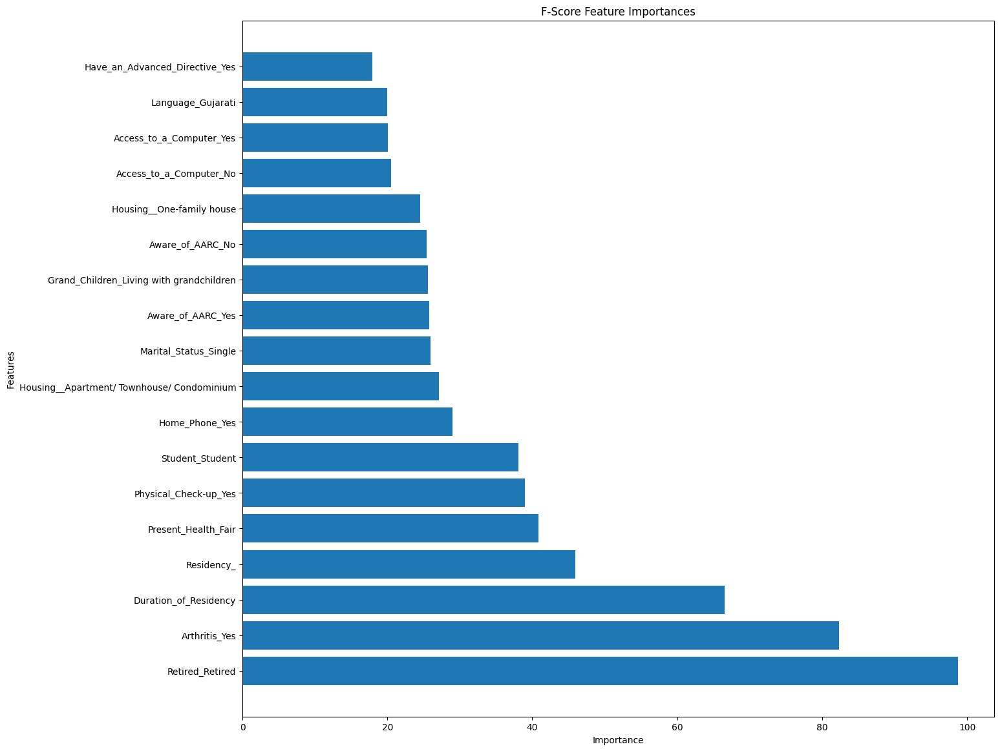

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs_indices_fscore = np.argsort(np.nan_to_num(select.scores_))[::-1][0:20]
fs_indices_fscore

best_features_fscore = diab_final.columns[fs_indices_fscore].values
print(best_features_fscore)
feature_importances_fscore = select.scores_[fs_indices_fscore]
print(feature_importances_fscore)

for i,each in enumerate(best_features_fscore,start=1):
    print ("{}.{}".format(i,each))

def plot_imp(best_features, scores, method_name):
    plt.figure(figsize=[15,14])
    plt.barh(best_features, scores)
    plt.title(method_name + ' Feature Importances')
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.show()

plot_imp(best_features_fscore[2:], feature_importances_fscore[2:], 'F-Score')

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)

from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train, y_train)

y_pred= lr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, lr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.8337
              precision    recall  f1-score   support

           0       0.80      0.90      0.84       814
           1       0.88      0.77      0.82       810

    accuracy                           0.83      1624
   macro avg       0.84      0.83      0.83      1624
weighted avg       0.84      0.83      0.83      1624

Recall: 0.769
Precision: 0.882
F1 Score: 0.822
Specificity Score: 0.8334263581390018
ROC AUC score: 0.912


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
from sklearn.tree import DecisionTreeClassifier
clr= DecisionTreeClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, clr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.8984
              precision    recall  f1-score   support

           0       0.90      0.89      0.90       814
           1       0.89      0.90      0.90       810

    accuracy                           0.90      1624
   macro avg       0.90      0.90      0.90      1624
weighted avg       0.90      0.90      0.90      1624

Recall: 0.905
Precision: 0.893
F1 Score: 0.899
Specificity Score: 0.898431148718505
ROC AUC score: 1.000


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
from sklearn import svm
sv = svm.SVC(kernel='linear',probability = True)
sv.fit(x_train, y_train)
y_pred = sv.predict(x_test)

print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, sv.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.8196
              precision    recall  f1-score   support

           0       0.78      0.90      0.83       814
           1       0.88      0.74      0.80       810

    accuracy                           0.82      1624
   macro avg       0.83      0.82      0.82      1624
weighted avg       0.83      0.82      0.82      1624

Recall: 0.741
Precision: 0.878
F1 Score: 0.804
Specificity Score: 0.8191938579869614
ROC AUC score: 0.907


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=14)
model = GaussianNB()
model.fit(x_train, y_train)

y_pred= model.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, model.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.7161
              precision    recall  f1-score   support

           0       0.81      0.56      0.66       813
           1       0.66      0.87      0.75       811

    accuracy                           0.72      1624
   macro avg       0.74      0.72      0.71      1624
weighted avg       0.74      0.72      0.71      1624

Recall: 0.872
Precision: 0.664
F1 Score: 0.754
Specificity Score: 0.7165158591704242
ROC AUC score: 0.814


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)

from sklearn.ensemble import RandomForestClassifier
clr= RandomForestClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, clr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9317
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       814
           1       0.93      0.93      0.93       810

    accuracy                           0.93      1624
   macro avg       0.93      0.93      0.93      1624
weighted avg       0.93      0.93      0.93      1624

Recall: 0.931
Precision: 0.932
F1 Score: 0.931
Specificity Score: 0.9316463836578779
ROC AUC score: 1.000


#Feature Selection for top 40 Features (Final Results)

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn import feature_selection as fs
select = fs.SelectKBest(fs.f_classif, k=40)
x_n = select.fit_transform(x1, y1)
x_n.shape
cols = select.get_support(indices=True)
db1 = diab_final.iloc[:,cols]

In [ ]:
chi_scores = chi2(x1,y1)

1.Hypertension_Yes
2.Age
3.Retired_Retired
4.Arthritis_Yes
5.Duration_of_Residency
6.Residency_
7.Present_Health_Fair
8.Physical_Check-up_Yes
9.Student_Student
10.Home_Phone_Yes
11.Housing__Apartment/ Townhouse/ Condominium
12.Marital_Status_Single
13.Aware_of_AARC_Yes
14.Grand_Children_Living with grandchildren
15.Aware_of_AARC_No
16.Housing__One-family house
17.Access_to_a_Computer_No
18.Access_to_a_Computer_Yes
19.Language_Gujarati
20.Have_an_Advanced_Directive_Yes
21.Present_Oral_Health_Fair
22.Primary_Care_Yes
23.General_Practitioner_Yes
24.Status_of_Ownership_Rent
25.Marital_Status_Married
26.Spouse_Living with spouse
27.Present_Health_Poor
28.Status_of_Ownership_Own
29.Present_Mental_Health_Fair
30.Friends_Living with friends/roommates
31.Dental_Insurance_Yes
32.Present_Health_Very Good
33.Nursing_Home_No
34.See_Friends
35.Social_Networks_(City-based)_Yes
36.English_Classes_Yes
37.English_Classes_No
38.Brother/Sister_Living with brothers/sisters
39.Quality_of_Life
40.Nursing_Hom

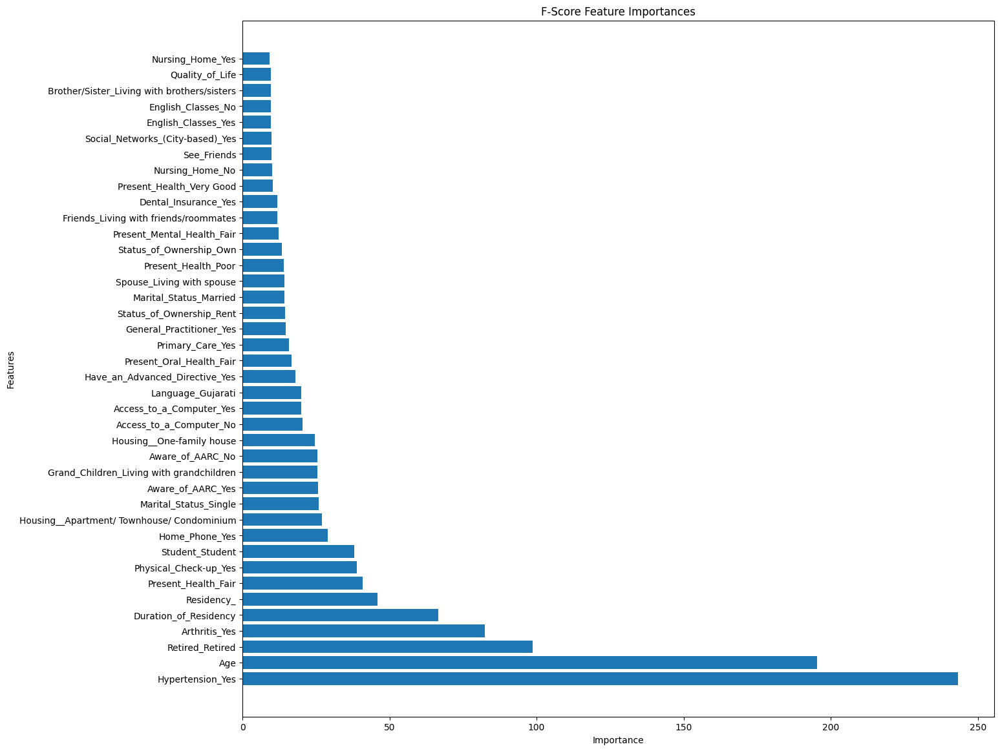

In [ ]:
import numpy as np
fs_indices_fscore = np.argsort(np.nan_to_num(select.scores_))[::-1][0:40]
fs_indices_fscore

best_features_fscore = diab_final.columns[fs_indices_fscore].values
best_features_fscore
feature_importances_fscore = select.scores_[fs_indices_fscore]
feature_importances_fscore
for i,each in enumerate(best_features_fscore,start=1):
    print ("{}.{}".format(i,each))

def plot_imp(best_features, scores, method_name):
    plt.figure(figsize=[15,14])
    plt.barh(best_features, scores)
    plt.title(method_name + ' Feature Importances')
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.show()

plot_imp(best_features_fscore, feature_importances_fscore, 'F-Score')

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train, y_train)

y_pred= lr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, lr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9095
              precision    recall  f1-score   support

           0       0.87      0.97      0.91       814
           1       0.96      0.85      0.90       810

    accuracy                           0.91      1624
   macro avg       0.92      0.91      0.91      1624
weighted avg       0.92      0.91      0.91      1624

Recall: 0.851
Precision: 0.964
F1 Score: 0.904
Specificity Score: 0.9091934933888957
ROC AUC score: 0.970


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
from sklearn.tree import DecisionTreeClassifier
clr= DecisionTreeClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, clr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9095
              precision    recall  f1-score   support

           0       0.92      0.89      0.91       814
           1       0.90      0.93      0.91       810

    accuracy                           0.91      1624
   macro avg       0.91      0.91      0.91      1624
weighted avg       0.91      0.91      0.91      1624

Recall: 0.926
Precision: 0.896
F1 Score: 0.911
Specificity Score: 0.9095635604256294
ROC AUC score: 1.000


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
from sklearn import svm
sv = svm.SVC(kernel='linear', probability = True)
sv.fit(x_train, y_train)
y_pred = sv.predict(x_test)

print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, sv.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9046
              precision    recall  f1-score   support

           0       0.86      0.97      0.91       814
           1       0.97      0.84      0.90       810

    accuracy                           0.90      1624
   macro avg       0.91      0.90      0.90      1624
weighted avg       0.91      0.90      0.90      1624

Recall: 0.837
Precision: 0.967
F1 Score: 0.897
Specificity Score: 0.9042248585352033
ROC AUC score: 0.968


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=6)
model = GaussianNB()
model.fit(x_train, y_train)

y_pred= model.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, model.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.7395
              precision    recall  f1-score   support

           0       0.85      0.57      0.68       803
           1       0.68      0.90      0.78       821

    accuracy                           0.74      1624
   macro avg       0.77      0.74      0.73      1624
weighted avg       0.77      0.74      0.73      1624

Recall: 0.904
Precision: 0.683
F1 Score: 0.778
Specificity Score: 0.7358503390810588
ROC AUC score: 0.877


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)

from sklearn.ensemble import RandomForestClassifier
clr= RandomForestClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, clr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9575
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       814
           1       0.98      0.93      0.96       810

    accuracy                           0.96      1624
   macro avg       0.96      0.96      0.96      1624
weighted avg       0.96      0.96      0.96      1624

Recall: 0.933
Precision: 0.981
F1 Score: 0.956
Specificity Score: 0.957393499634879
ROC AUC score: 1.000


#Feature Selection for top 60 Features (Final Results)

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn import feature_selection as fs
select = fs.SelectKBest(fs.f_classif, k=60)
x_n = select.fit_transform(x1, y1)
x_n.shape
cols = select.get_support(indices=True)
db1 = diab_final.iloc[:,cols]

1.Hypertension_Yes
2.Age
3.Retired_Retired
4.Arthritis_Yes
5.Duration_of_Residency
6.Residency_
7.Present_Health_Fair
8.Physical_Check-up_Yes
9.Student_Student
10.Home_Phone_Yes
11.Housing__Apartment/ Townhouse/ Condominium
12.Marital_Status_Single
13.Aware_of_AARC_Yes
14.Grand_Children_Living with grandchildren
15.Aware_of_AARC_No
16.Housing__One-family house
17.Access_to_a_Computer_No
18.Access_to_a_Computer_Yes
19.Language_Gujarati
20.Have_an_Advanced_Directive_Yes
21.Present_Oral_Health_Fair
22.Primary_Care_Yes
23.General_Practitioner_Yes
24.Status_of_Ownership_Rent
25.Marital_Status_Married
26.Spouse_Living with spouse
27.Present_Health_Poor
28.Status_of_Ownership_Own
29.Present_Mental_Health_Fair
30.Friends_Living with friends/roommates
31.Dental_Insurance_Yes
32.Present_Health_Very Good
33.Nursing_Home_No
34.See_Friends
35.Social_Networks_(City-based)_Yes
36.English_Classes_Yes
37.English_Classes_No
38.Brother/Sister_Living with brothers/sisters
39.Quality_of_Life
40.Nursing_Hom

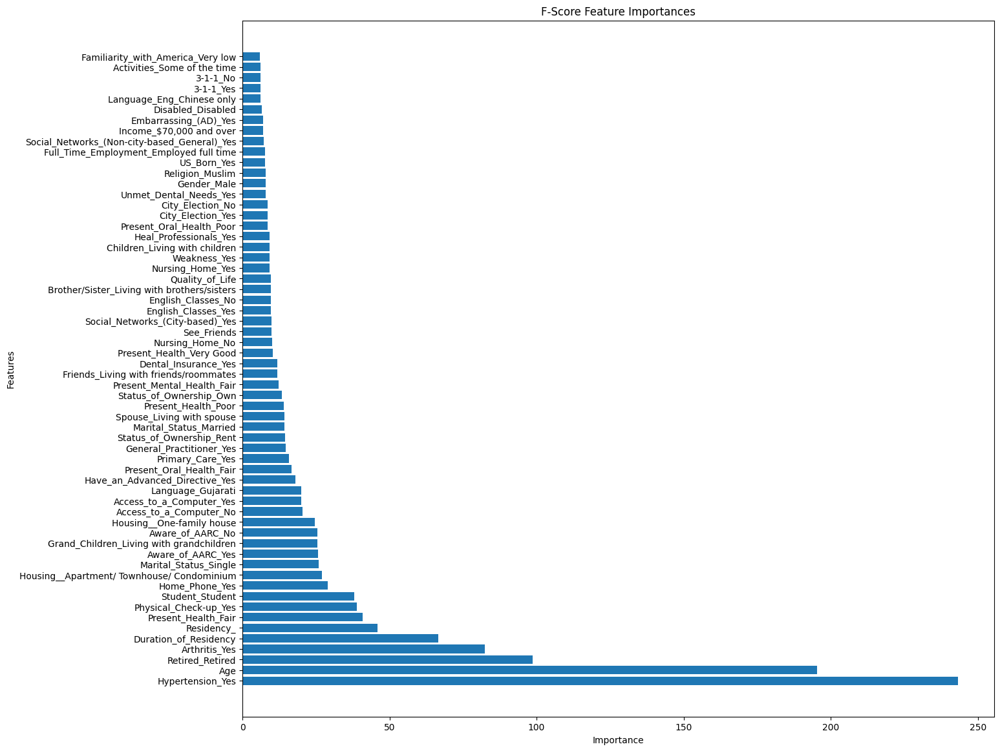

In [ ]:
import numpy as np
fs_indices_fscore = np.argsort(np.nan_to_num(select.scores_))[::-1][0:60]
fs_indices_fscore

best_features_fscore = diab_final.columns[fs_indices_fscore].values
best_features_fscore
feature_importances_fscore = select.scores_[fs_indices_fscore]
feature_importances_fscore

for i,each in enumerate(best_features_fscore,start=1):
    print ("{}.{}".format(i,each))

def plot_imp(best_features, scores, method_name):
    plt.figure(figsize=[15,14])
    plt.barh(best_features, scores)
    plt.title(method_name + ' Feature Importances')
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.show()

plot_imp(best_features_fscore, feature_importances_fscore, 'F-Score')

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(x_train, y_train)

y_pred= lr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, lr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9323
              precision    recall  f1-score   support

           0       0.90      0.98      0.94       814
           1       0.97      0.89      0.93       810

    accuracy                           0.93      1624
   macro avg       0.94      0.93      0.93      1624
weighted avg       0.94      0.93      0.93      1624

Recall: 0.888
Precision: 0.974
F1 Score: 0.929
Specificity Score: 0.9320467877939141
ROC AUC score: 0.982


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
from sklearn.tree import DecisionTreeClassifier
clr= DecisionTreeClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, clr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9046
              precision    recall  f1-score   support

           0       0.92      0.88      0.90       814
           1       0.89      0.92      0.91       810

    accuracy                           0.90      1624
   macro avg       0.91      0.90      0.90      1624
weighted avg       0.91      0.90      0.90      1624

Recall: 0.925
Precision: 0.888
F1 Score: 0.906
Specificity Score: 0.9046555922992704
ROC AUC score: 1.000


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
from sklearn import svm
sv = svm.SVC(kernel='linear', probability= True)
sv.fit(x_train, y_train)
y_pred = sv.predict(x_test)

print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, sv.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9298
              precision    recall  f1-score   support

           0       0.88      0.99      0.93       814
           1       0.99      0.87      0.92       810

    accuracy                           0.93      1624
   macro avg       0.94      0.93      0.93      1624
weighted avg       0.94      0.93      0.93      1624

Recall: 0.865
Precision: 0.993
F1 Score: 0.925
Specificity Score: 0.9294866369579013
ROC AUC score: 0.978


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)
model = GaussianNB()
model.fit(x_train, y_train)

y_pred= model.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, model.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.7174
              precision    recall  f1-score   support

           0       0.90      0.49      0.64       814
           1       0.65      0.94      0.77       810

    accuracy                           0.72      1624
   macro avg       0.77      0.72      0.70      1624
weighted avg       0.77      0.72      0.70      1624

Recall: 0.943
Precision: 0.649
F1 Score: 0.769
Specificity Score: 0.718474337152498
ROC AUC score: 0.908


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


sm = SMOTE(random_state=2)
x, y= sm.fit_resample(db1, y1.ravel())


from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(x)

x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.35, random_state=0)

from sklearn.ensemble import RandomForestClassifier
clr= RandomForestClassifier(criterion='entropy', random_state=0)
clr.fit(x_train, y_train)

y_pred= clr.predict(x_test)
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
print('Recall: %.3f' % recall_score(y_test, y_pred))
print('Precision: %.3f' % precision_score(y_test, y_pred))
print('F1 Score: %.3f' % f1_score(y_test, y_pred))
print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
print('ROC AUC score: %.3f' % roc_auc_score(y_train, clr.predict_proba(x_train)[:, 1]), end='\n')

Model accuracy score with criterion entropy: 0.9563
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       814
           1       0.98      0.93      0.95       810

    accuracy                           0.96      1624
   macro avg       0.96      0.96      0.96      1624
weighted avg       0.96      0.96      0.96      1624

Recall: 0.930
Precision: 0.982
F1 Score: 0.955
Specificity Score: 0.9561498242532726
ROC AUC score: 1.000


#ELI 5


In [ ]:
pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 216 kB 4.9 MB/s 
     |████████████████████████████████| 133 kB 64.8 MB/s 
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=8fe8d673460933c45ff9ba5d39246b7c70fb71b976b1d8fbc530f40ac6b0aa31
  Stored in directory: /root/.cache/pip/wheels/85/ac/25/ffcd87ef8f9b1eec324fdf339359be71f22612459d8c75d89c
Successfully built eli5
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
notebook 5.7.16 requires jinja2<=3.0.0, but you have jinja2 3.1.2 which is incompatible.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which is incompa

In [ ]:
import eli5
import numpy as np

a=eli5.show_weights(lr)

a

Weight?,Feature
+1.178,x1
+0.636,x5
+0.383,x6
+0.335,x7
+0.318,x0
+0.004,<BIAS>
-0.050,x4
-0.093,x3
-0.260,x2


In [ ]:
!pip install anchor

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 126 kB 4.4 MB/s 
     |████████████████████████████████| 4.0 MB 11.6 MB/s 
     |████████████████████████████████| 114 kB 43.2 MB/s 
     |████████████████████████████████| 124 kB 33.3 MB/s 
     |████████████████████████████████| 593 kB 42.9 MB/s 
     |████████████████████████████████| 1.9 MB 48.9 MB/s 
     |████████████████████████████████| 432 kB 25.9 MB/s 
     |████████████████████████████████| 50 kB 5.7 MB/s 
     |████████████████████████████████| 128 kB 52.4 MB/s 
     |████████████████████████████████| 254 kB 50.9 MB/s 
     |████████████████████████████████| 100 kB 9.5 MB/s 
     |████████████████████████████████| 46 kB 3.3 MB/s 
  Using cached pbr-5.11.0-py2.py3-none-any.whl (112 kB)
     |████████████████████████████████| 76 kB 2.3 MB/s 
     |████████████████████████████████| 189 kB 47.7 MB/s 
     |████████████████████████████████| 7

In [ ]:
!apt install anchor_tabular
%load_ext autoreload
%autoreload 2

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package anchor_tabular


In [ ]:
std(n_scores)

0.015831331710571283

In [ ]:
from sklearn.metrics import accuracy_score
print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred))

#Validating the methodology on PIMA Dataset


In [ ]:
import pandas as pd
import numpy as np
from scipy import stats


pid=pd.read_csv(r'/content/drive/MyDrive/pima-indians-diabetes (1).csv')

pid

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [ ]:
for i in pid.columns:
  print(i,pid[i].skew())

Pregnancies 0.9016739791518588
Glucose 0.17375350179188992
BloodPressure  -1.8436079833551302
SkinThickness 0.10937249648187608
Insulin 2.272250858431574
BMI -0.42898158845356543
DiabetesPedigreeFunction  1.919911066307204
Age 1.1295967011444805
Outcome 0.635016643444986


In [ ]:
import numpy as np
pid['Insulin'] = pid['Insulin'].apply(lambda x: np.power(x,1/2))
pid['Insulin'].skew()
pid['BloodPressure '] = pid['BloodPressure '].apply(lambda x: np.power(x,2))
pid['BloodPressure '].skew()
pid['BMI'] = pid['BMI'].apply(lambda x: np.power(x,2))
pid['BMI'].skew()
pid['DiabetesPedigreeFunction '] = pid['DiabetesPedigreeFunction '].apply(lambda x: np.power(x,1/2))
pid['DiabetesPedigreeFunction '].skew()

0.9018017197488095

In [ ]:
X1=pid.iloc[:,:-1]

In [ ]:
Y1=pid.iloc[:,-1]

In [ ]:
from sklearn.metrics import precision_score
from imblearn.metrics import specificity_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import MinMaxScaler

                           Pregnancies   Glucose  BloodPressure   \
Pregnancies                   1.000000  0.129459        0.175320   
Glucose                       0.129459  1.000000        0.193076   
BloodPressure                 0.175320  0.193076        1.000000   
SkinThickness                -0.081672  0.057328        0.142755   
Insulin                      -0.118077  0.238519        0.029217   
BMI                          -0.000498  0.216395        0.286708   
DiabetesPedigreeFunction     -0.030336  0.127247        0.029468   
Age                           0.544341  0.263514        0.293206   
Outcome                       0.221898  0.466581        0.113143   

                           SkinThickness   Insulin       BMI  \
Pregnancies                    -0.081672 -0.118077 -0.000498   
Glucose                         0.057328  0.238519  0.216395   
BloodPressure                   0.142755  0.029217  0.286708   
SkinThickness                   1.000000  0.535045  0.384862   

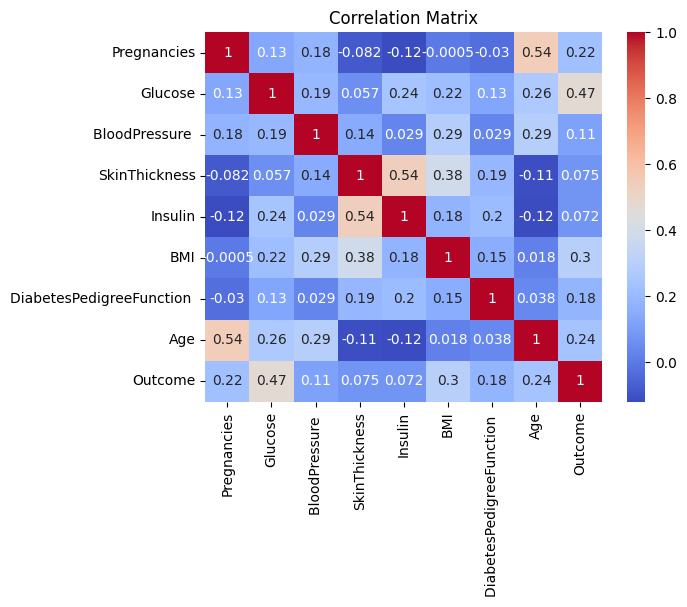

In [ ]:
import pandas as pd
import numpy as np

# Create a synthetic dataset

# Calculate the correlation matrix
correlation_matrix = pid.corr()

# Print the correlation matrix
print(correlation_matrix)

# Optional: Use seaborn to visualize the correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV


from sklearn.model_selection import cross_val_score,KFold
from sklearn.naive_bayes import GaussianNB



sm = SMOTE()
x, y= sm.fit_resample(X1, Y1.ravel())


scaler = StandardScaler()
X = scaler.fit_transform(x)

for i in range(0,200,1):
  print("Results for random state:" , i)
  x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.20, random_state= i )
  gb = GaussianNB()
  gnb=gb.fit(x_train, y_train)

  y_pred= gb.predict(x_test)

  print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
  from sklearn.metrics import classification_report
  print(classification_report(y_test, y_pred))
  print('Recall: %.3f' % recall_score(y_test, y_pred))
  print('Precision: %.3f' % precision_score(y_test, y_pred))
  print('F1 Score: %.3f' % f1_score(y_test, y_pred))
  print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
  print('ROC AUC score: %.3f' % roc_auc_score(y_train, gb.predict_proba(x_train)[:, 1]), end='\n')


Results for random state: 0
Model accuracy score with criterion entropy: 0.7550
              precision    recall  f1-score   support

           0       0.75      0.79      0.77       105
           1       0.76      0.72      0.74        95

    accuracy                           0.76       200
   macro avg       0.76      0.75      0.75       200
weighted avg       0.76      0.76      0.75       200

Recall: 0.716
Precision: 0.756
F1 Score: 0.735
Specificity Score: 0.7512656641604011
ROC AUC score: 0.824
Results for random state: 1
Model accuracy score with criterion entropy: 0.7050
              precision    recall  f1-score   support

           0       0.75      0.71      0.73       111
           1       0.66      0.70      0.68        89

    accuracy                           0.70       200
   macro avg       0.70      0.70      0.70       200
weighted avg       0.71      0.70      0.71       200

Recall: 0.697
Precision: 0.660
F1 Score: 0.678
Specificity Score: 0.703340925194

In [ ]:
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV


from sklearn.model_selection import cross_val_score,KFold
from sklearn.naive_bayes import GaussianNB



sm = SMOTE()
x, y= sm.fit_resample(X1, Y1.ravel())


scaler = StandardScaler()
X = scaler.fit_transform(x)

for i in range(0,200,1):
  print("Results for random state:" , i)
  x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.20, random_state= i )
  gb = GaussianNB()
  gnb=gb.fit(x_train, y_train)

  y_pred= gb.predict(x_test)

  print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
  from sklearn.metrics import classification_report
  print(classification_report(y_test, y_pred))
  print('Recall: %.3f' % recall_score(y_test, y_pred))
  print('Precision: %.3f' % precision_score(y_test, y_pred))
  print('F1 Score: %.3f' % f1_score(y_test, y_pred))
  print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
  print('ROC AUC score: %.3f' % roc_auc_score(y_train, gb.predict_proba(x_train)[:, 1]), end='\n')


Results for random state: 0
Model accuracy score with criterion entropy: 0.8000
              precision    recall  f1-score   support

           0       0.82      0.80      0.81       105
           1       0.78      0.80      0.79        95

    accuracy                           0.80       200
   macro avg       0.80      0.80      0.80       200
weighted avg       0.80      0.80      0.80       200

Recall: 0.800
Precision: 0.784
F1 Score: 0.792
Specificity Score: 0.8
ROC AUC score: 0.815
Results for random state: 1
Model accuracy score with criterion entropy: 0.7150
              precision    recall  f1-score   support

           0       0.76      0.71      0.73       111
           1       0.67      0.72      0.69        89

    accuracy                           0.71       200
   macro avg       0.71      0.72      0.71       200
weighted avg       0.72      0.71      0.72       200

Recall: 0.719
Precision: 0.667
F1 Score: 0.692
Specificity Score: 0.7158128353072172
ROC AUC sc

In [ ]:
from collections import Counter

print(Counter(Y1))

Counter({0: 500, 1: 268})


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

sm = SMOTE()
x, y= sm.fit_resample(X1, Y1.ravel())


scaler = StandardScaler()
X = scaler.fit_transform(x)

for i in range(1,200,1):
  print("Results for random state:", i)
  x_train, x_test, y_train, y_test= train_test_split(X, y, test_size= 0.20, random_state= i)
  from sklearn.linear_model import LogisticRegression
  lr = LogisticRegression()
  lr.fit(x_train, y_train)


  y_pred= lr.predict(x_test)
  print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
  from sklearn.metrics import classification_report
  print(classification_report(y_test, y_pred))
  print('Recall: %.3f' % recall_score(y_test, y_pred))
  print('Precision: %.3f' % precision_score(y_test, y_pred))
  print('F1 Score: %.3f' % f1_score(y_test, y_pred))
  print('Specificity Score ' , specificity_score(y_test, y_pred, average= 'weighted'))
  print('ROC AUC score: %.3f' % roc_auc_score(y_train, lr.predict_proba(x_train)[:, 1]))

Results for random state: 1
Model accuracy score with criterion entropy: 0.7450
              precision    recall  f1-score   support

           0       0.82      0.69      0.75       111
           1       0.68      0.81      0.74        89

    accuracy                           0.74       200
   macro avg       0.75      0.75      0.74       200
weighted avg       0.76      0.74      0.75       200

Recall: 0.809
Precision: 0.679
F1 Score: 0.738
Specificity Score  0.7576824577386375
ROC AUC score: 0.846
Results for random state: 2
Model accuracy score with criterion entropy: 0.7500
              precision    recall  f1-score   support

           0       0.70      0.78      0.74        91
           1       0.80      0.72      0.76       109

    accuracy                           0.75       200
   macro avg       0.75      0.75      0.75       200
weighted avg       0.75      0.75      0.75       200

Recall: 0.725
Precision: 0.798
F1 Score: 0.760
Specificity Score  0.754990422421

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

sm = SMOTE()
x, y= sm.fit_resample(X1, Y1.ravel())


scaler = StandardScaler()
X = scaler.fit_transform(x)
for i in range(0,100,1):
  print("Results for random state:" , i)
  x_train, x_test, y_train, y_test= train_test_split(X, y, test_size=0.20, random_state=i)
  from sklearn.tree import DecisionTreeClassifier
  dt= DecisionTreeClassifier(criterion='entropy')
  dt.fit(x_train, y_train)

  y_pred= dt.predict(x_test)
  print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
  from sklearn.metrics import classification_report
  print(classification_report(y_test, y_pred))
  print('Recall: %.3f' % recall_score(y_test, y_pred))
  print('Precision: %.3f' % precision_score(y_test, y_pred))
  print('F1 Score: %.3f' % f1_score(y_test, y_pred))
  print('Specificity Score ' , specificity_score(y_test, y_pred, average='weighted'))
  print('ROC AUC score: %.3f' % roc_auc_score(y_train, dt.predict_proba(x_train)[:, 1]))

Results for random state: 0
Model accuracy score with criterion entropy: 0.7500
              precision    recall  f1-score   support

           0       0.76      0.76      0.76       105
           1       0.74      0.74      0.74        95

    accuracy                           0.75       200
   macro avg       0.75      0.75      0.75       200
weighted avg       0.75      0.75      0.75       200

Recall: 0.737
Precision: 0.737
F1 Score: 0.737
Specificity Score  0.7487468671679198
ROC AUC score: 1.000
Results for random state: 1
Model accuracy score with criterion entropy: 0.7600
              precision    recall  f1-score   support

           0       0.82      0.72      0.77       111
           1       0.70      0.81      0.75        89

    accuracy                           0.76       200
   macro avg       0.76      0.76      0.76       200
weighted avg       0.77      0.76      0.76       200

Recall: 0.809
Precision: 0.699
F1 Score: 0.750
Specificity Score  0.769709484765

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

sm = SMOTE()
x, y= sm.fit_resample(X1, Y1.ravel())


scaler = StandardScaler()
X = scaler.fit_transform(x)

for i in range(1,100,1):
  print("Results for random state:" , i)
  x_train, x_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)
  from sklearn import svm
  sv = svm.SVC(kernel= 'rbf' ,probability=True)
  sv.fit(x_train, y_train)
  y_pred = sv.predict(x_test)

  print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
  from sklearn.metrics import classification_report
  print(classification_report(y_test, y_pred))
  print('Recall: %.3f' % recall_score(y_test, y_pred))
  print('Precision: %.3f' % precision_score(y_test, y_pred))
  print('F1 Score: %.3f' % f1_score(y_test, y_pred))
  print('Specificity Score: ' , specificity_score(y_test, y_pred, average='weighted'))
  print('ROC AUC score: %.3f' % roc_auc_score(y_train, sv.predict_proba(x_train)[:, 1]))

Results for random state: 1
Model accuracy score with criterion entropy: 0.7600
              precision    recall  f1-score   support

           0       0.84      0.70      0.76       111
           1       0.69      0.83      0.76        89

    accuracy                           0.76       200
   macro avg       0.77      0.77      0.76       200
weighted avg       0.77      0.76      0.76       200

Recall: 0.831
Precision: 0.692
F1 Score: 0.755
Specificity Score:  0.7741633768600061
ROC AUC score: 0.920
Results for random state: 2
Model accuracy score with criterion entropy: 0.7800
              precision    recall  f1-score   support

           0       0.76      0.76      0.76        91
           1       0.80      0.80      0.80       109

    accuracy                           0.78       200
   macro avg       0.78      0.78      0.78       200
weighted avg       0.78      0.78      0.78       200

Recall: 0.798
Precision: 0.798
F1 Score: 0.798
Specificity Score:  0.7764068958

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

sm = SMOTE(random_state=9)
x, y= sm.fit_resample(X1, Y1.ravel())


scaler = StandardScaler()
X = scaler.fit_transform(x)

for i in range(100,300,1):
  print("Results for random state:" , i)
  x_train, x_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)
  from sklearn.ensemble import RandomForestClassifier
  rfc= RandomForestClassifier(criterion='entropy', random_state=0)
  rfc.fit(x_train, y_train)

  y_pred= rfc.predict(x_test)
  print('Model accuracy score with criterion entropy: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))
  from sklearn.metrics import classification_report
  print(classification_report(y_test, y_pred))
  print('Recall: %.3f' % recall_score(y_test, y_pred))
  print('Precision: %.3f' % precision_score(y_test, y_pred))
  print('F1 Score: %.3f' % f1_score(y_test, y_pred))
  print('Specificity Score:' , specificity_score(y_test, y_pred, average='weighted'))
  print('ROC AUC score: %.3f' % roc_auc_score(y_train, rfc.predict_proba(x_train)[:, 1]))

Results for random state: 100
Model accuracy score with criterion entropy: 0.8100
              precision    recall  f1-score   support

           0       0.84      0.79      0.81       104
           1       0.78      0.83      0.81        96

    accuracy                           0.81       200
   macro avg       0.81      0.81      0.81       200
weighted avg       0.81      0.81      0.81       200

Recall: 0.833
Precision: 0.784
F1 Score: 0.808
Specificity Score: 0.8117948717948719
ROC AUC score: 1.000
Results for random state: 101
Model accuracy score with criterion entropy: 0.8000
              precision    recall  f1-score   support

           0       0.79      0.77      0.78        91
           1       0.81      0.83      0.82       109

    accuracy                           0.80       200
   macro avg       0.80      0.80      0.80       200
weighted avg       0.80      0.80      0.80       200

Recall: 0.826
Precision: 0.811
F1 Score: 0.818
Specificity Score: 0.79491884

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn import feature_selection as fs
select = fs.SelectKBest(fs.f_classif, k=8)
x_n = select.fit_transform(X1,Y1)
x_n.shape
cols = select.get_support(indices=True)
db1 = pid.iloc[:,cols]

['Glucose' 'BMI' 'Age' 'Pregnancies' 'DiabetesPedigreeFunction '
 'BloodPressure ' 'SkinThickness' 'Insulin']
[213.16175218  74.16431404  46.14061124  39.67022739  25.94429927
   9.93303243   4.30438091   4.02996876]
1.Glucose
2.BMI
3.Age
4.Pregnancies
5.DiabetesPedigreeFunction 
6.BloodPressure 
7.SkinThickness
8.Insulin


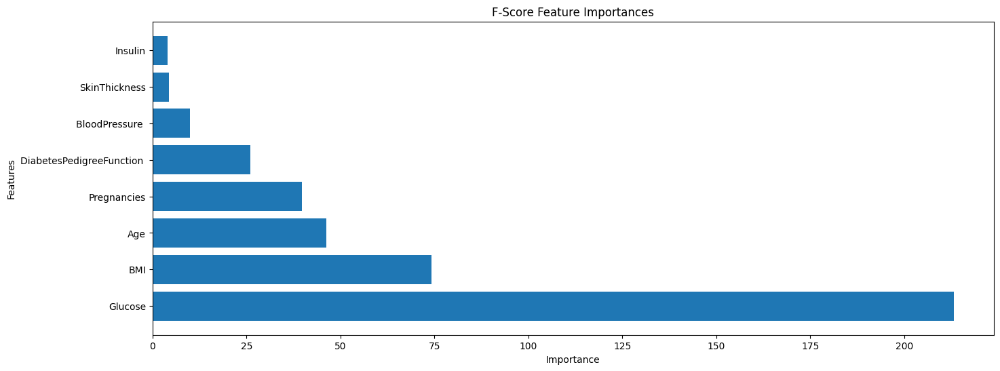

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs_indices_fscore = np.argsort(np.nan_to_num(select.scores_))[::-1][0:8]
fs_indices_fscore

best_features_fscore = pid.columns[fs_indices_fscore].values
print(best_features_fscore)
feature_importances_fscore = select.scores_[fs_indices_fscore]
print(feature_importances_fscore)

for i,each in enumerate(best_features_fscore,start=1):
    print ("{}.{}".format(i,each))

def plot_imp(best_features, scores, method_name):
    plt.figure(figsize=[16,6])
    plt.barh(best_features, scores)
    plt.title(method_name + ' Feature Importances')
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.show()

plot_imp(best_features_fscore[:], feature_importances_fscore[:], 'F-Score')

In [ ]:
import pickle

with open('rfc_xai', 'wb') as files:
    pickle.dump(rfc, files)

with open('rfc_xai' , 'rb') as f:
    rfc = pickle.load(f)


#Using XAI techniques to explain predictions on PIMA dataset



In [ ]:
!pip install shap
import shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 6.0 MB/s eta 0:00:00


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
pid

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,5184,35,0.000000,1128.96,0.791833,50,1
1,1,85,4356,29,0.000000,707.56,0.592453,31,0
2,8,183,4096,0,0.000000,542.89,0.819756,32,1
3,1,89,4356,23,9.695360,789.61,0.408656,21,0
4,0,137,1600,35,12.961481,1857.61,1.512614,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,5776,48,13.416408,1082.41,0.413521,63,0
764,2,122,4900,27,0.000000,1354.24,0.583095,27,0
765,5,121,5184,23,10.583005,686.44,0.494975,30,0
766,1,126,3600,0,0.000000,906.01,0.590762,47,1


In [ ]:
x_test
x_test = pd.DataFrame(x_test,columns=X1.columns)

In [ ]:
x_test

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,-0.291594,-0.798370,-0.262604,0.169313,0.428643,-0.252620,1.502687,-0.533564
1,-0.904832,0.473375,1.203322,0.947465,0.163760,0.361926,1.648687,0.612937
2,-1.211450,-1.084513,-0.262604,0.752927,1.276745,0.959278,-0.206594,-0.798141
3,0.934880,1.141042,1.039815,-1.322146,-0.961339,-0.404554,-1.217324,1.142091
4,-0.598213,-0.448640,-0.743728,-1.322146,-0.961339,-0.890007,-0.357880,-0.974526
5,-1.211450,-0.003529,-0.262604,-1.322146,-0.961339,-1.045924,-0.989029,-1.150910
6,3.081211,1.586153,-0.629085,0.623235,-0.961339,0.013673,-0.957601,0.348360
7,0.628262,0.155439,-0.918042,-0.479147,-0.228754,-0.119294,1.098536,-0.445371
8,2.467974,-1.052719,-0.629085,-0.868224,1.519374,-0.736195,1.445806,0.877514
9,2.161355,-0.162497,0.571846,1.077157,0.930187,1.362148,1.080465,1.230284


In [ ]:
# Fits the explainer
explainer = shap.Explainer(lr.predict, x_test)
# Calculates the SHAP values - It takes some time
shap_values = explainer(x)

shap_values_test = explainer(x_test)

fn=shap_values.feature_names

#shap.plots.bar(shap_values)

print("SHAP Version : {}".format(shap.__version__))

Exact explainer: 1001it [00:29, 34.36it/s]                          


SHAP Version : 0.42.1


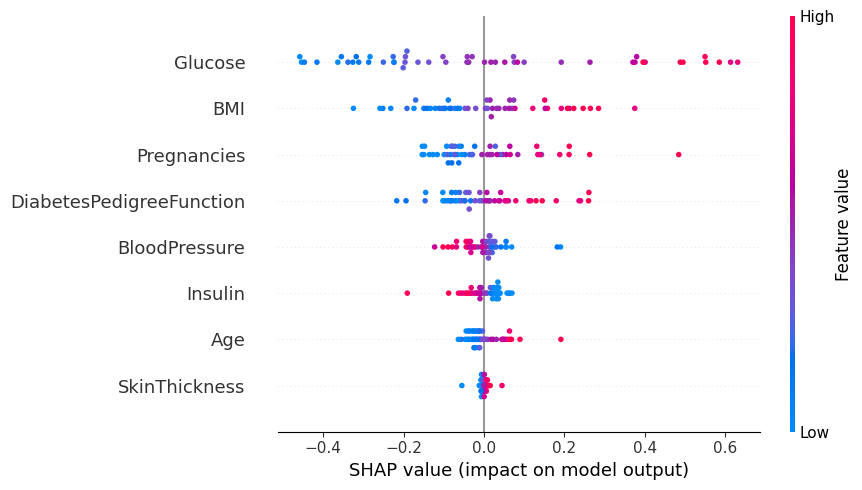

Size: [6.4 4.8]
Size: [8.6 5. ]


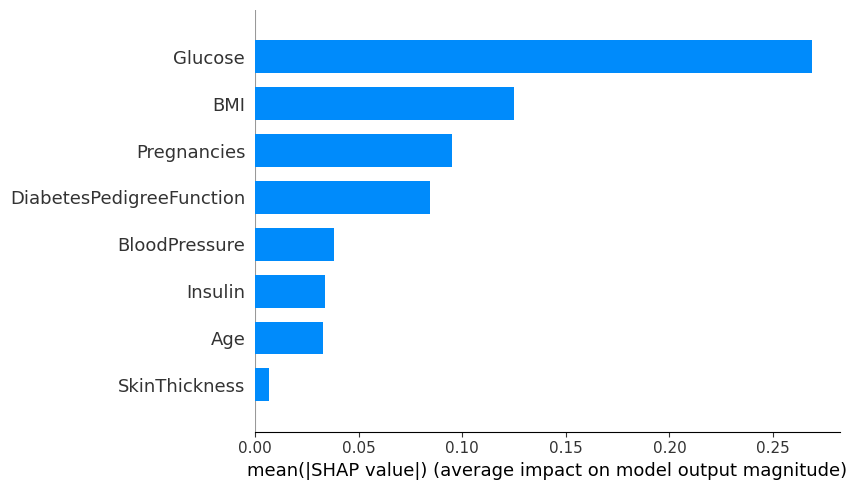

In [ ]:
shap.summary_plot(shap_values_test,  class_names={0:'Non-diabetic', 1:'Diabetic'},feature_names = ['Pregnancies',	'Glucose',	'BloodPressure'	,'SkinThickness',	'Insulin',	'BMI',	'DiabetesPedigreeFunction',	'Age'], plot_size=[9,5] )
print(f'Size: {plt.gcf().get_size_inches()}')
shap.summary_plot(shap_values_test,  show= False,    plot_type='bar',  class_names={0:'se', 1:'dia'},feature_names = ['Pregnancies',	'Glucose',	'BloodPressure'	,'SkinThickness',	'Insulin',	'BMI',	'DiabetesPedigreeFunction',	'Age'],plot_size = [8.6,5])
print(f'Size: {plt.gcf().get_size_inches()}')

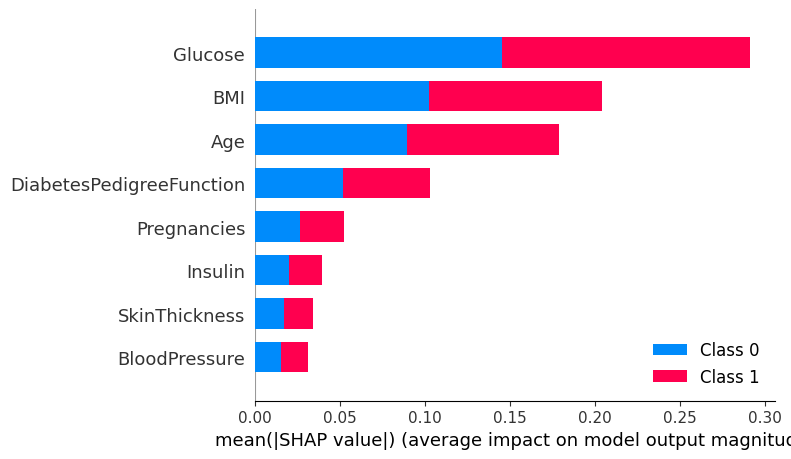

Size: [6.4 4.8]


<Figure size 640x480 with 0 Axes>

In [ ]:
shap.summary_plot(shap_values_test, feature_names = ['Pregnancies',	'Glucose',	'BloodPressure'	,'SkinThickness',	'Insulin',	'BMI',	'DiabetesPedigreeFunction',	'Age'])
print(f'Size: {plt.gcf().get_size_inches()}')
#shap.summary_plot(shap_values, feature_names = ['Pregnancies',	'Glucose',	'BloodPressure'	,'SkinThickness',	'Insulin',	'BMI',	'DiabetesPedigreeFunction',	'Age'])

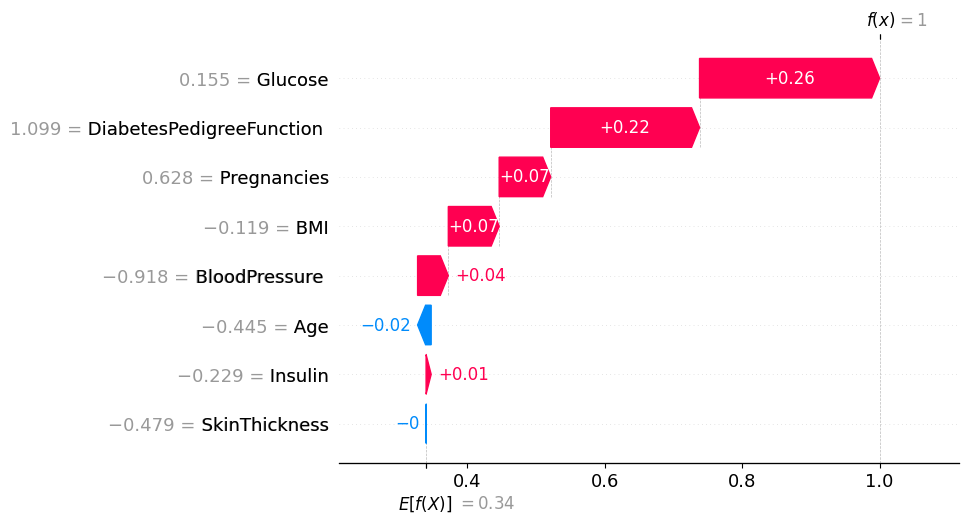

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


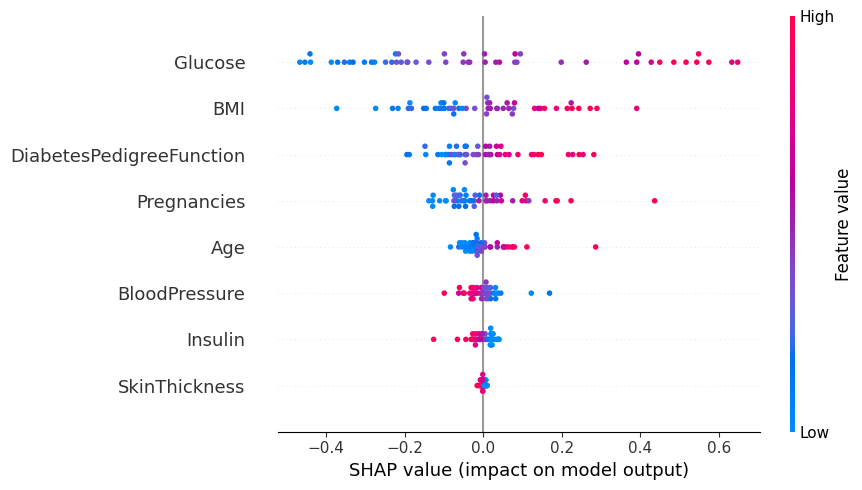

Size: [6.4 4.8]


<Figure size 640x480 with 0 Axes>

In [ ]:
#shap.plots.waterfall(shap_values[7])
shap.plots.waterfall(shap_values_test[7])
shap.summary_plot(shap_values_test,  class_names={0:'Non-diabetic', 1:'Diabetic'},feature_names = ['Pregnancies',	'Glucose',	'BloodPressure'	,'SkinThickness',	'Insulin',	'BMI',	'DiabetesPedigreeFunction',	'Age'], plot_size=[9,5] )
print(f'Size: {plt.gcf().get_size_inches()}')

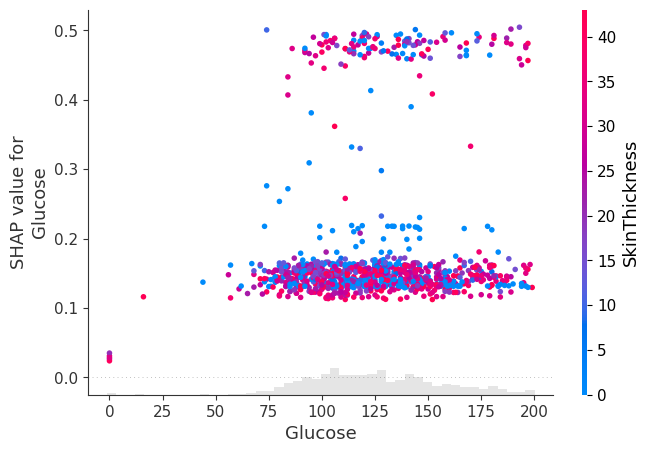

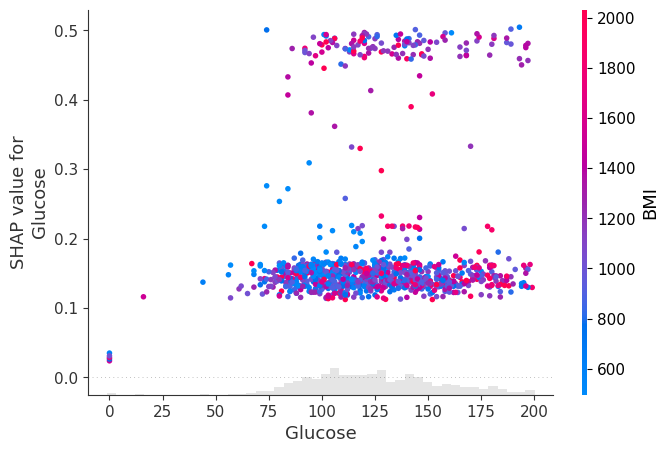

In [ ]:
shap.plots.scatter(shap_values[:,'Glucose'], color=shap_values[:, "SkinThickness"])
#shap.plots.scatter(shap_values[:,'Glucose'], color=shap_values[:, "Insulin"])
shap.plots.scatter(shap_values[:,'Glucose'], color=shap_values[:, "BMI"])
#shap.plots.scatter(shap_values[:,'Glucose'], color=shap_values[:, "DiabetesPedigreeFunction "])

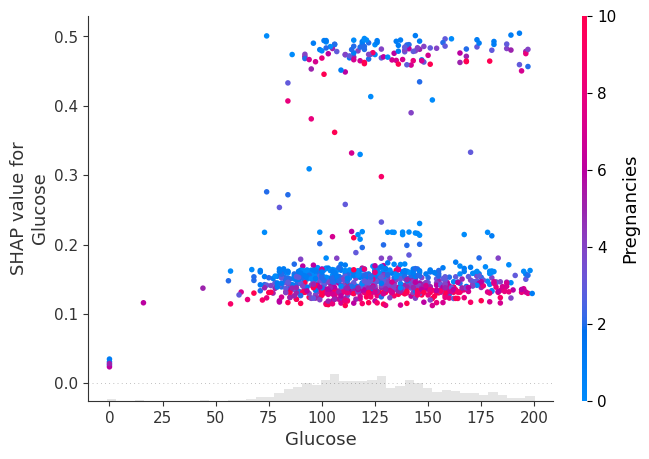

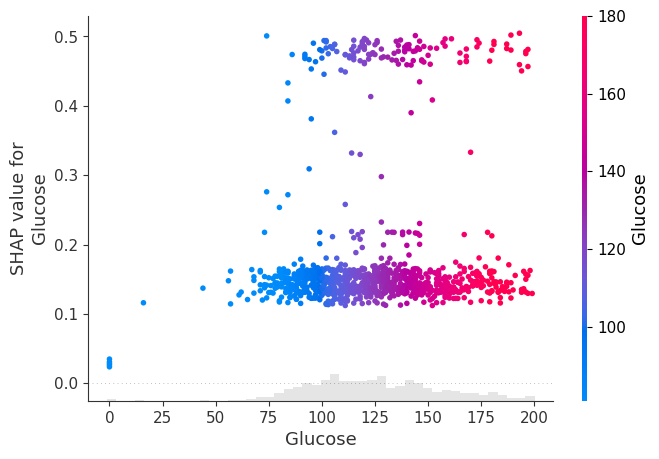

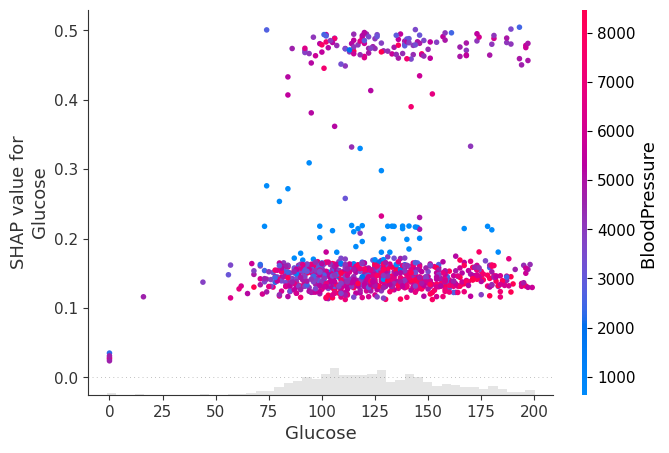

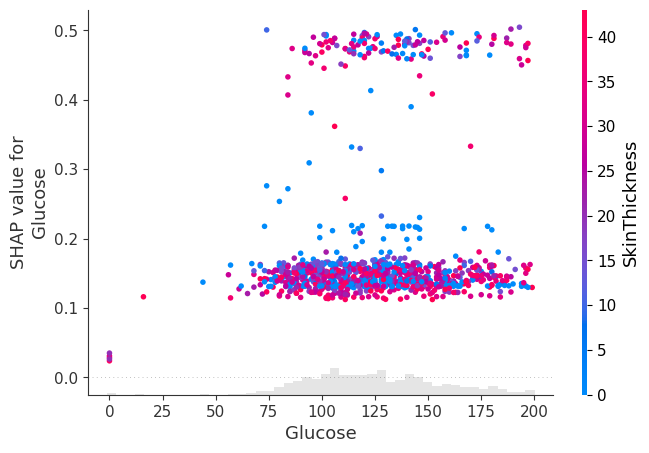

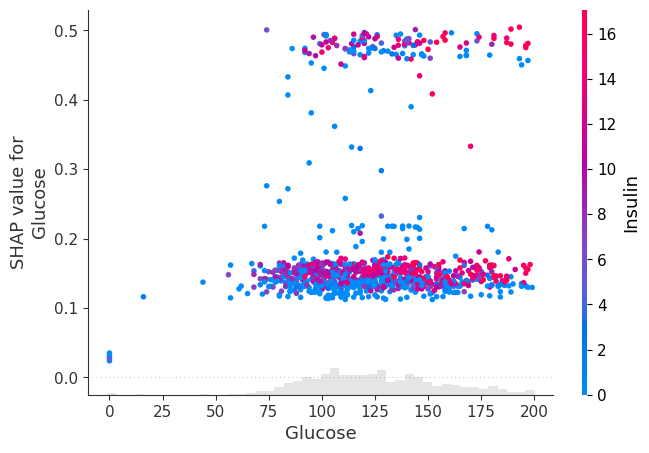

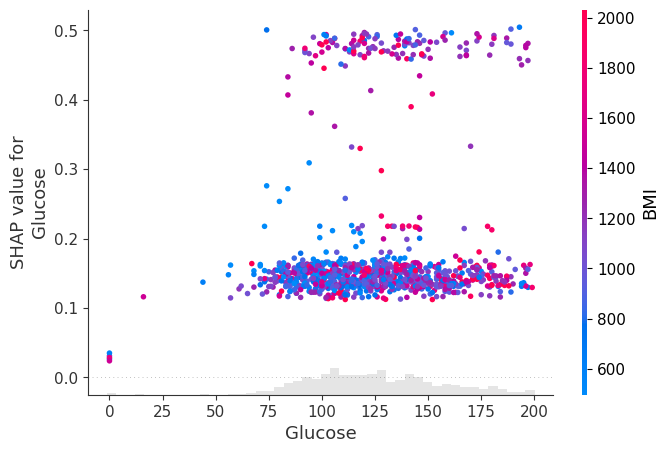

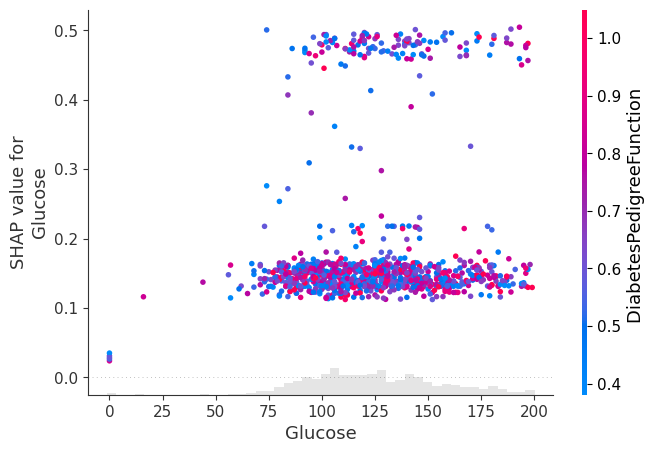

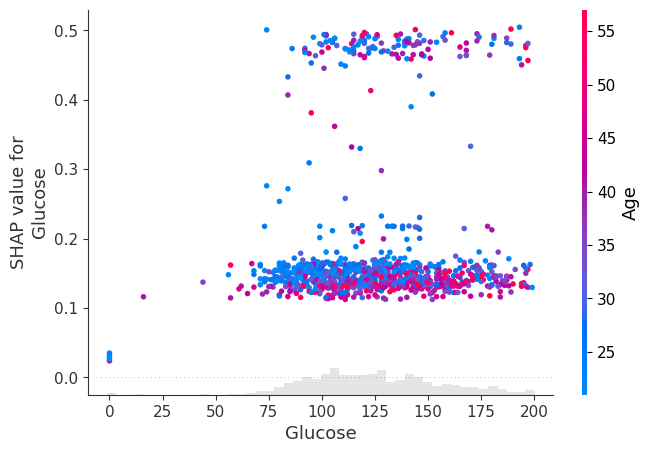

In [ ]:
for i in X1.columns:
  shap.plots.scatter(shap_values[:,'Glucose'], color=shap_values[:, i])

In [ ]:
%out[9] 66

UsageError: Line magic function `%out[9]` not found.


In [ ]:
# Fits the explainer
explainer = shap.TreeExplainer(rfc)
# Calculates the SHAP values - It takes some time
shap_values_test = explainer.shap_values(x_test)

shap_values = explainer.shap_values(x)
print("SHAP Version : {}".format(shap.__version__))

SHAP Version : 0.42.1


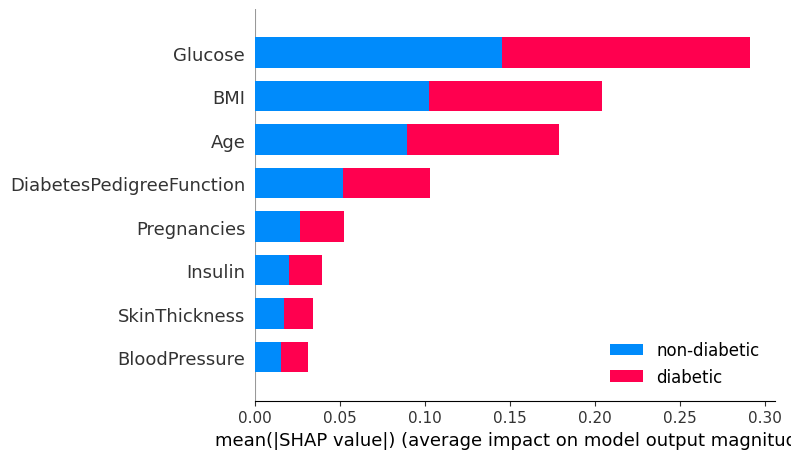

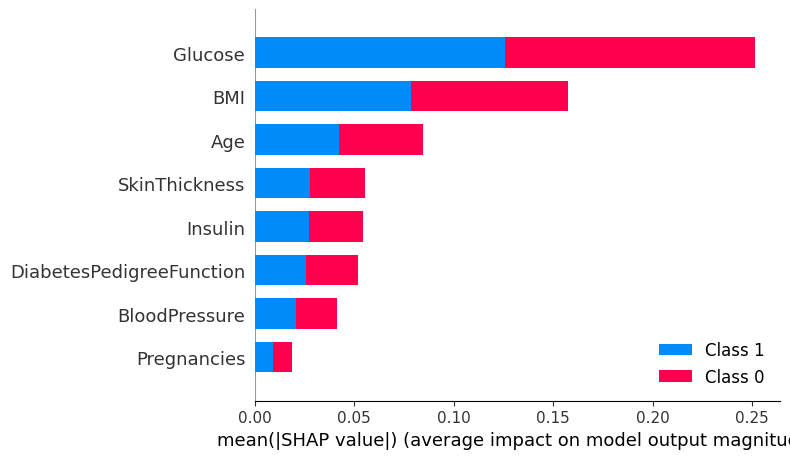

In [ ]:
shap.summary_plot(shap_values_test,  class_names={0:'non-diabetic', 1:'diabetic'},feature_names = ['Pregnancies',	'Glucose',	'BloodPressure'	,'SkinThickness',	'Insulin',	'BMI',	'DiabetesPedigreeFunction',	'Age'])

shap.summary_plot(shap_values, feature_names = ['Pregnancies',	'Glucose',	'BloodPressure'	,'SkinThickness',	'Insulin',	'BMI',	'DiabetesPedigreeFunction',	'Age'])


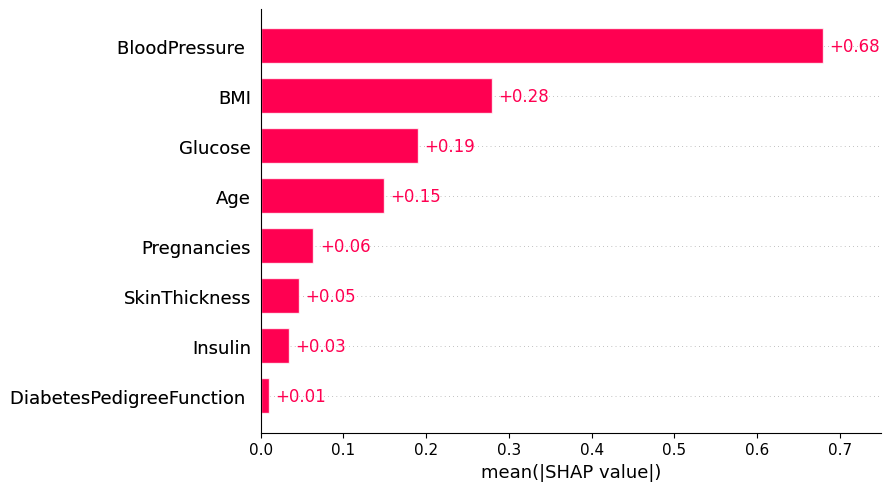

In [ ]:
shap.plots.bar(shap_values, max_display=12)

In [ ]:
ft= X1.columns

In [ ]:
print(dt.feature_importances_)
for col,score in zip(ft,dt.feature_importances_):
    print('%s, %0.3f ' %(col,score))

[0.05893386 0.27009916 0.09273674 0.05068695 0.05126012 0.23177884
 0.11682324 0.12768108]
Pregnancies, 0.059 
Glucose, 0.270 
BloodPressure , 0.093 
SkinThickness, 0.051 
Insulin, 0.051 
BMI, 0.232 
DiabetesPedigreeFunction , 0.117 
Age, 0.128 
